# CA 2 Visualization

# All the imports

In [1]:
import numpy as num
import pandas as pan
from sklearn.preprocessing import StandardScaler as ss
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE as ts
import plotly.graph_objs as graph
import plotly .offline as ofl
import plotly.figure_factory as fig
from sklearn.cluster import KMeans
import matplotlib.pyplot as py
import plotly.figure_factory as fig
import seaborn as sea
from sklearn.preprocessing import LabelEncoder as le
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Dataset Clients

# functions definition to Importing dataset and examining it

In [2]:
def Data(x):
    y = pan.read_csv(x)
    print("\n\nHead\n\n")
    print(y.head(5))
    print("\n\nTail\n\n")
    print(y.tail(5))
    return y

def Examin(x):
    print("\n\nShape\n\n")
    print(x.shape)
    print("\n\nInfo\n\n")
    print(x.info())
    print("\n\nDescribe\n\n")
    print(x.describe())

# Importing dataset and examining it

In [3]:
f = "Clients.csv"
data = Data(f)
Examin(data)



Head


   age           job  marital  education default  balance housing personal  \
0   58    management  married   tertiary      no     2143     yes       no   
1   44    technician   single  secondary      no       29     yes       no   
2   33  entrepreneur  married  secondary      no        2     yes      yes   
3   35    management  married   tertiary      no      231     yes       no   
4   28    management   single   tertiary      no      447     yes      yes   

  term  
0   no  
1   no  
2   no  
3   no  
4   no  


Tail


       age           job   marital  education default  balance housing  \
43188   51    technician   married   tertiary      no      825      no   
43189   71       retired  divorced    primary      no     1729      no   
43190   72       retired   married  secondary      no     5715      no   
43191   57   blue-collar   married  secondary      no      668      no   
43192   37  entrepreneur   married  secondary      no     2971      no   

      personal

#As we can see above, there is only two columns with Numerical Values and seven columns with Nominal or Categorical values.

# Converting Nominal Values to Numerical Values

In [4]:
cat_col = num.asarray(['job','marital','education','default','housing','personal','term'])
dis_col = num.asarray(['age','balance'])

converter = le()
for i in cat_col:
    data[i] = converter.fit_transform(data[i].astype(str))
print(data.head())
Examin(data)

   age  job  marital  education  default  balance  housing  personal  term
0   58    4        1          2        0     2143        1         0     0
1   44    9        2          1        0       29        1         0     0
2   33    2        1          1        0        2        1         1     0
3   35    4        1          2        0      231        1         0     0
4   28    4        2          2        0      447        1         1     0


Shape


(43193, 9)


Info


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43193 entries, 0 to 43192
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        43193 non-null  int64
 1   job        43193 non-null  int32
 2   marital    43193 non-null  int32
 3   education  43193 non-null  int32
 4   default    43193 non-null  int32
 5   balance    43193 non-null  int64
 6   housing    43193 non-null  int32
 7   personal   43193 non-null  int32
 8   term       43193 non-null  

# Module Check missing value 

In [5]:
def missing_value(data):
    #count the number of missing value 
    total = data.isnull().sum().sort_values(ascending = False)
    percent = round(data.isnull().sum()/len(data)*100,2).sort_values(ascending = False)
    missing  = pan.concat([total, percent], axis=1, keys=['Total_Missing', 'Percent(%)'])
    
    return missing.head(20)

In [6]:
dataframe = data
missing_value(dataframe)

,Total_Missing,Percent(%)
term,0,0.0
personal,0,0.0
housing,0,0.0
balance,0,0.0
default,0,0.0
education,0,0.0
marital,0,0.0
job,0,0.0
age,0,0.0


# Visualization to better understand the data

#As there is no null values in the dataset

# Defining age and balance into categorical

In [7]:
def age_c(x):
    if x <= 19:
        return 0 # Teenage
    elif (x > 19 and x <= 30):
        return 1 # Young
    elif (x > 30 and x < 60):
        return 2 # Middle
    else:
        return 3 # Old
def bal_c(x):
    if x < 1000:
        return 0 # Lower than thousand in balance
    else:
        return 1 # More or Equal than thousand in balance
Z = data.copy()
data['age'] = data['age'].apply(age_c)
data['balance'] = data['balance'].apply(bal_c)
X = data.copy()
print(X.head())
print(X.info())
col = num.asarray(X.columns)

   age  job  marital  education  default  balance  housing  personal  term
0    2    4        1          2        0        1        1         0     0
1    2    9        2          1        0        0        1         0     0
2    2    2        1          1        0        0        1         1     0
3    2    4        1          2        0        0        1         0     0
4    1    4        2          2        0        0        1         1     0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43193 entries, 0 to 43192
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        43193 non-null  int64
 1   job        43193 non-null  int32
 2   marital    43193 non-null  int32
 3   education  43193 non-null  int32
 4   default    43193 non-null  int32
 5   balance    43193 non-null  int64
 6   housing    43193 non-null  int32
 7   personal   43193 non-null  int32
 8   term       43193 non-null  int32
dtypes: int32(7), int64(

# Countplot of all categorical values

age
0       31
1     6748
2    34794
3     1620
dtype: int64


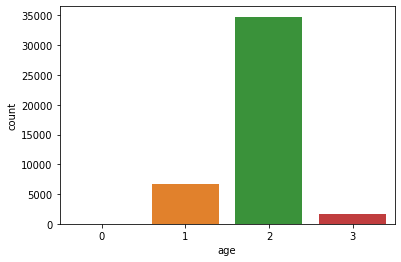

job
0     5000
1     9278
2     1411
3     1195
4     9216
5     2145
6     1540
7     4004
8      775
9     7355
10    1274
dtype: int64


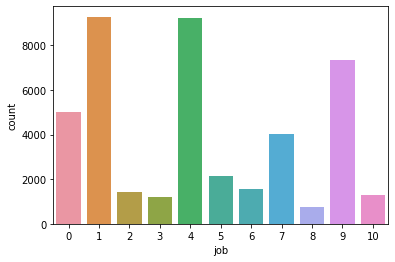

marital
0     5028
1    25946
2    12219
dtype: int64


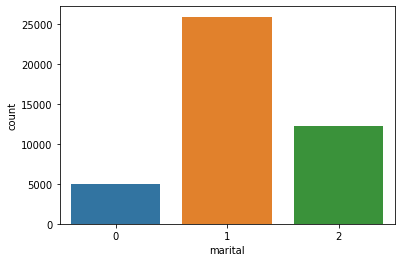

education
0     6800
1    23131
2    13262
dtype: int64


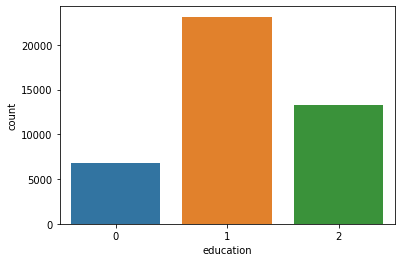

default
0    42411
1      782
dtype: int64


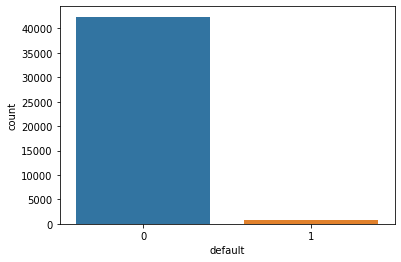

balance
0    29273
1    13920
dtype: int64


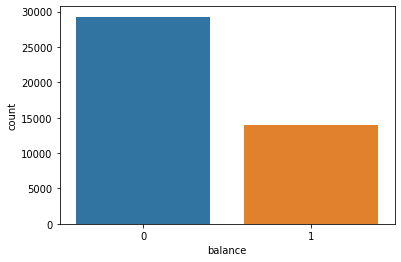

housing
0    18901
1    24292
dtype: int64


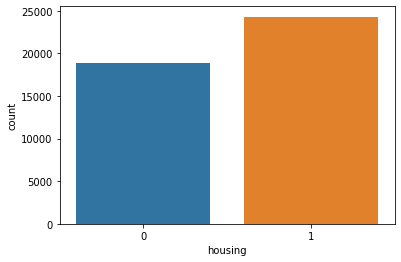

personal
0    36086
1     7107
dtype: int64


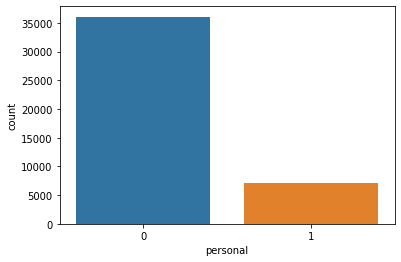

term
0    38172
1     5021
dtype: int64


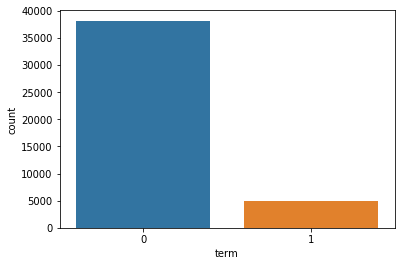

In [8]:
z = 0
while (z < len(col)):
    print(X.groupby(col[z]).size())
    sea.countplot(X[col[z]],label="Count")
    py.show()
    z = z+1

# Scatter plot of age vs balance according to all the categories

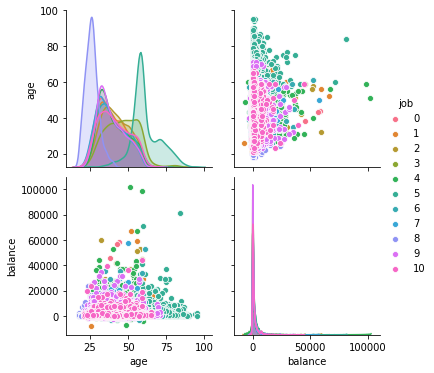

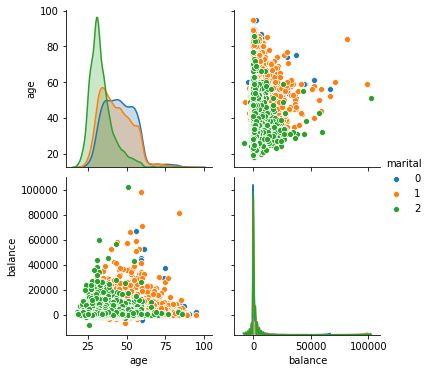

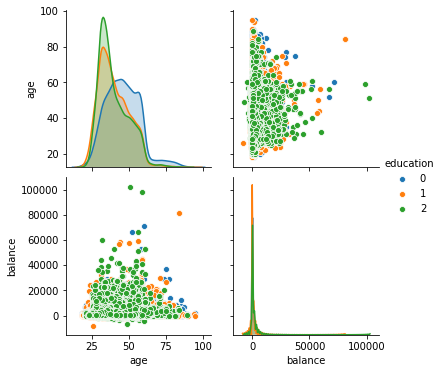

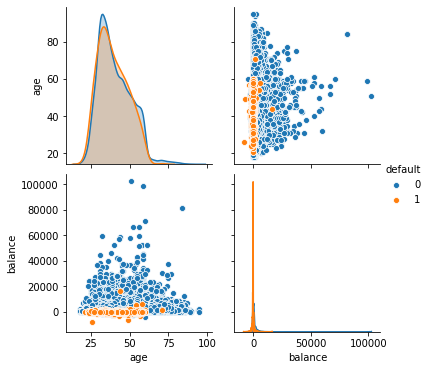

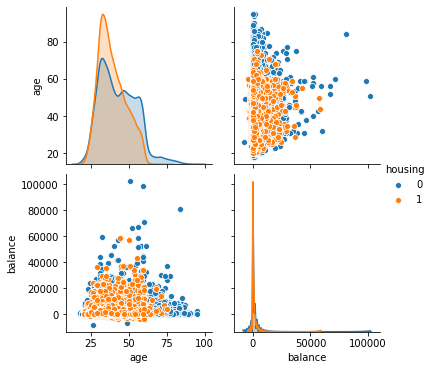

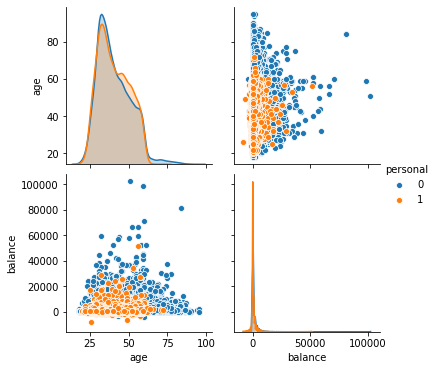

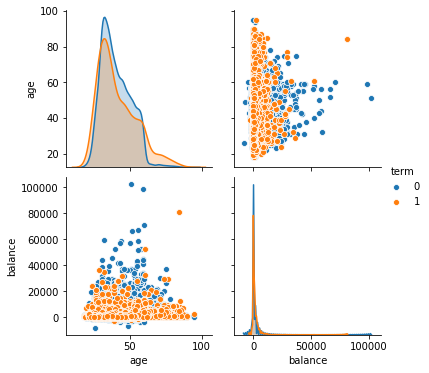

In [9]:
z = 0
def scat():
    global z
    g = sea.pairplot(Z[[dis_col[0],dis_col[1],cat_col[z]]],hue = cat_col[z])
    z = z+1
    if(z < len(cat_col)):
        scat()
scat()

# Bar plot of all the categories

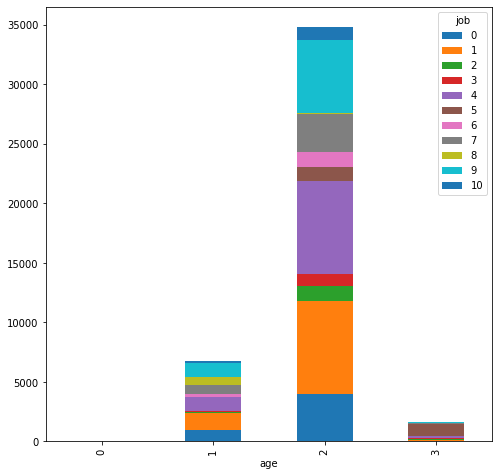

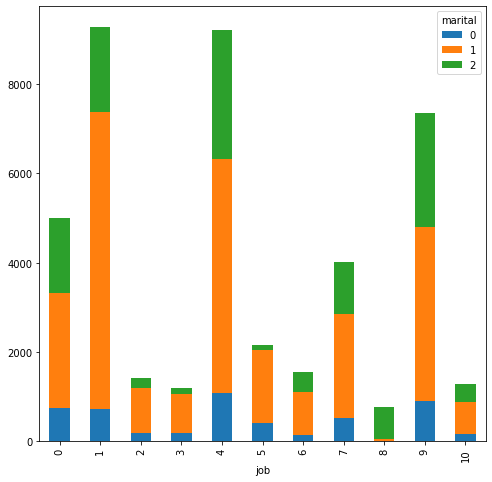

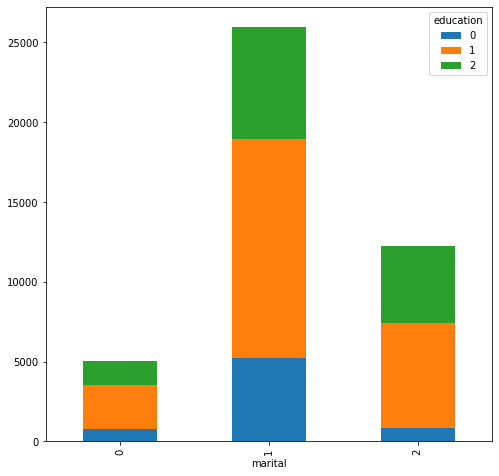

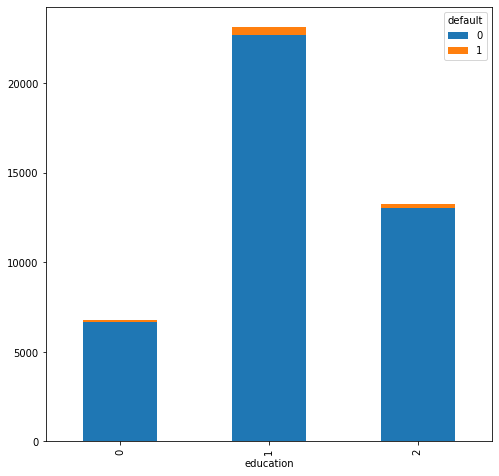

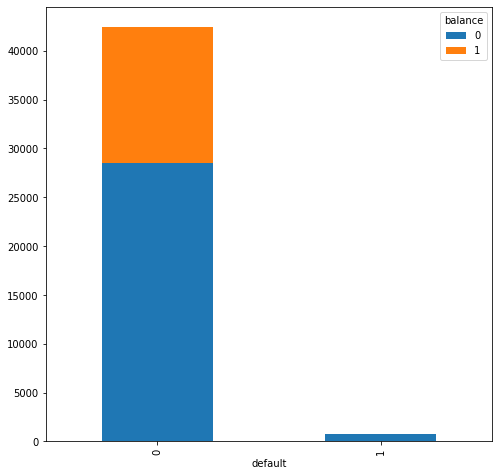

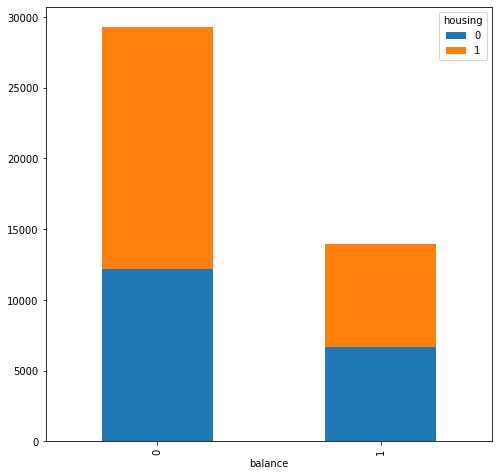

In [10]:
z = 0
def scat():
    global z
    table = pan.crosstab(index=X[col[z]],columns=X[col[z+1]])
    table.plot(kind="bar",figsize=(8,8),stacked=True)
    z = z+1
    if(z < (len(cat_col)-1)):
       scat()
scat()

# BoxPlot 

In [11]:
d = Data(f)



Head


   age           job  marital  education default  balance housing personal  \
0   58    management  married   tertiary      no     2143     yes       no   
1   44    technician   single  secondary      no       29     yes       no   
2   33  entrepreneur  married  secondary      no        2     yes      yes   
3   35    management  married   tertiary      no      231     yes       no   
4   28    management   single   tertiary      no      447     yes      yes   

  term  
0   no  
1   no  
2   no  
3   no  
4   no  


Tail


       age           job   marital  education default  balance housing  \
43188   51    technician   married   tertiary      no      825      no   
43189   71       retired  divorced    primary      no     1729      no   
43190   72       retired   married  secondary      no     5715      no   
43191   57   blue-collar   married  secondary      no      668      no   
43192   37  entrepreneur   married  secondary      no     2971      no   

      personal

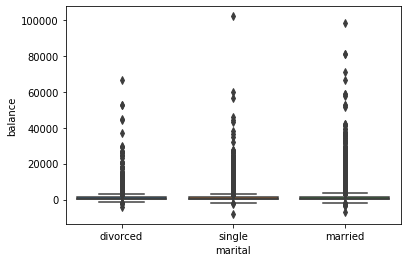

In [12]:
sorted_nb = d.groupby(['marital'])['balance'].median().sort_values()
sea.boxplot(x=d['marital'], y=d['balance'], order=list(sorted_nb.index))

# Visualizing age and balance seperately 

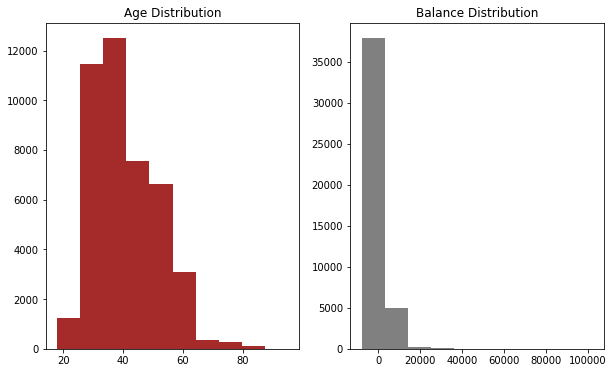

In [13]:
age_balance = py.figure(figsize = (10,6))

plot1 = age_balance.add_subplot(1,2,1) 
plot2 = age_balance.add_subplot(1,2,2)

plot1.hist(d['age'], color='brown')
plot1.set_title('Age Distribution')

plot2.hist(d['balance'], color = 'gray')
plot2.set_title('Balance Distribution')

py.show()

# Clients with eduaction in different education sector

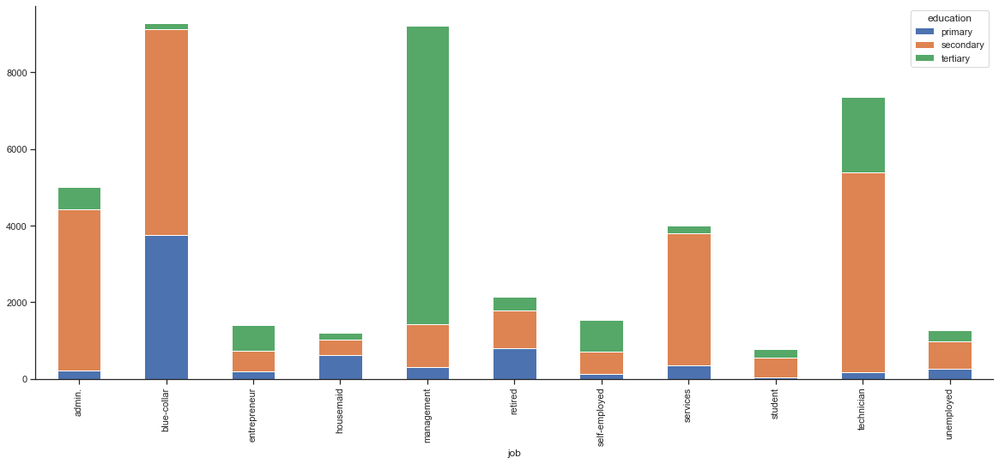

In [14]:
sea.set(style="ticks")

filtered_clients = d[(d['education'].isin(['primary', 'secondary','tertiary'])) & 
                      (d['job'].isin(["admin.", "unemployed", "management", "housemaid",
"entrepreneur", "student", "blue-collar", "self-employed", "retired", "technician", "services"])) 
                     ]

clients_plot = filtered_clients.groupby(['education', 'job']).size().reset_index().pivot(columns='job', index='education', values=0).reset_index()

p = clients_plot.set_index('education').T.plot(kind='bar', stacked=True, 
            color=sea.color_palette())
sea.despine()
p.figure.set_size_inches(20,8)
    
py.show()

#1. Clients having tertiary education have most of their jobs in management sector
#2. Clients having secondary education have their job's divided into 4 major sectors which are admin, blue-collar, services, technician.
#3. Clients having primary education have most jobs in blue-collar sector

# Visualizations of default rate by job

In [15]:
job_defaulter = pan.crosstab(d['default'],d['job']).apply(lambda x: x/x.sum() * 100)
job_defaulter = job_defaulter.transpose()
job_defaulter

default,no,yes
job,,
admin.,98.620000,1.380000
blue-collar,97.952145,2.047855
entrepreneur,96.314670,3.685330
housemaid,98.242678,1.757322
management,98.263889,1.736111
retired,98.834499,1.165501
self-employed,97.857143,2.142857
services,98.201798,1.798202
student,99.612903,0.387097


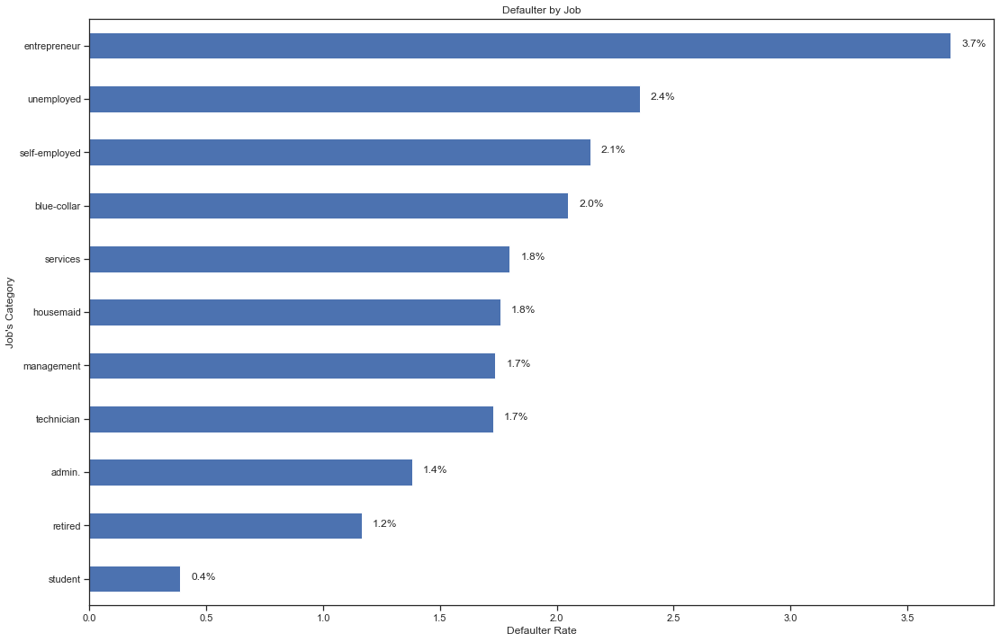

In [16]:
job_defaulter_plot = job_defaulter['yes'].sort_values(ascending = True).plot(kind ='barh',figsize = (18,12))
                                                                               
py.title('Defaulter by Job')
py.xlabel('Defaulter Rate')
py.ylabel("Job's Category")

# Label each bar
for rec, label in zip(job_defaulter_plot.patches,job_defaulter['yes'].sort_values(ascending = True).round(1).astype(str)):
    job_defaulter_plot.text(rec.get_width()+0.1, 
                  rec.get_y()+ rec.get_height()-0.3, 
                  label+'%', 
                  ha = 'center', 
                  va='bottom')

# Job's Distribution

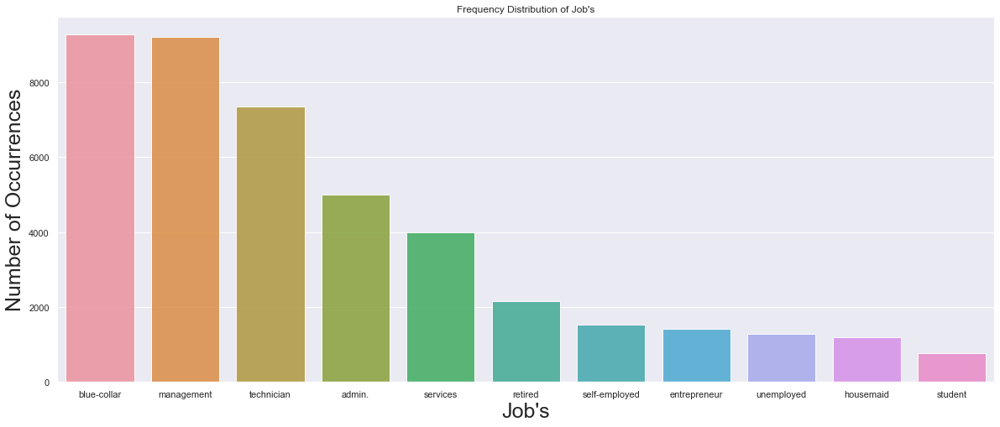

In [17]:
carrier_count = d['job'].value_counts()
sea.set(style="darkgrid")
p= sea.barplot(carrier_count.index, carrier_count.values, alpha=0.9)
p.figure.set_size_inches(20,8)
py.title("Frequency Distribution of Job's")
py.ylabel('Number of Occurrences', fontsize=25)
py.xlabel("Job's", fontsize=25)
py.show()

# Violin polt with respect to marital categories having perticular eduaction and balance 

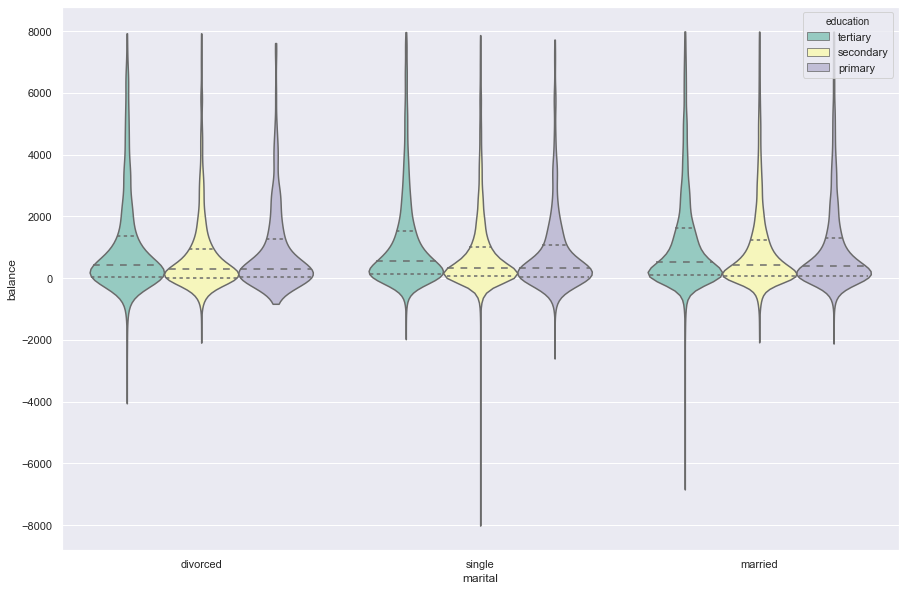

In [18]:
sorted_nb = d.groupby(['marital'])['balance'].median().sort_values()
py.subplots(figsize=(15,10))
sea.violinplot(x="marital", y="balance", hue = "education", data=d[d.balance < 8000],
               order=list(sorted_nb.index), cut=0, scale="width", palette="Set3", inner="quartile", height=8, aspect=3)


In [19]:
def distributions(df):
    py.figure(figsize=(10,5))
    fig, (ax1, ax2) = py.subplots(2,1, figsize=(8,8))
    sea.distplot(df["age"], ax=ax1)
    sea.distplot(df["balance"], ax=ax2)
    py.tight_layout()

<Figure size 720x360 with 0 Axes>

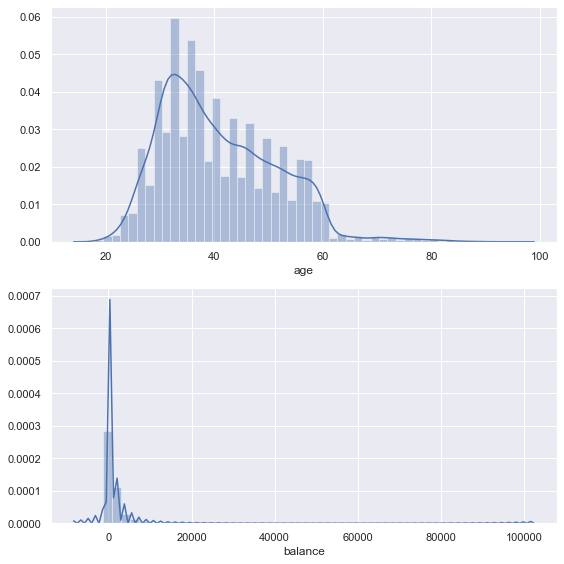

In [20]:
distributions(d)

# Converting data into Standardization format

In [21]:
scaler = ss()
# Fit your data on the scaler object
X = scaler.fit_transform(data)
X = pan.DataFrame(X, columns=col)
X.head()

,age,job,marital,education,default,balance,housing,personal,term
0,0.281526,-0.092261,-0.273116,1.278979,-0.135789,1.450154,0.882086,-0.443786,-0.362679
1,0.281526,1.451728,1.367367,-0.225008,-0.135789,-0.689582,0.882086,-0.443786,-0.362679
2,0.281526,-0.709857,-0.273116,-0.225008,-0.135789,-0.689582,0.882086,2.253337,-0.362679
3,0.281526,-0.092261,-0.273116,1.278979,-0.135789,-0.689582,0.882086,-0.443786,-0.362679
4,-2.061430,-0.092261,1.367367,1.278979,-0.135789,-0.689582,0.882086,2.253337,-0.362679


# Correaltion Matrix

#Plotting Correlation Heatmap

In [22]:
corrs = X.corr()
def cor(x):
    figure = fig.create_annotated_heatmap(
    z=x.values,
    x=list(x.columns),
    y=list(x.index),
    annotation_text=x.round(2).values,
    showscale=True)
    figure.show()
hc = corrs[abs(corrs) > 0.50]
print(hc.fillna('x'))
cor(corrs)

          age job marital education default balance housing personal term
age         1   x       x         x       x       x       x        x    x
job         x   1       x         x       x       x       x        x    x
marital     x   x       1         x       x       x       x        x    x
education   x   x       x         1       x       x       x        x    x
default     x   x       x         x       1       x       x        x    x
balance     x   x       x         x       x       1       x        x    x
housing     x   x       x         x       x       x       1        x    x
personal    x   x       x         x       x       x       x        1    x
term        x   x       x         x       x       x       x        x    1


No values lies below -0.5 and +0.5, so considering all values

# Implementing PCA to visualize dataset

In [23]:
pca = PCA(n_components = 2)
pca.fit(X)
x_pca = pca.transform(X)
print("Variance explained by each of the n_components: ",pca.explained_variance_ratio_)
print("Total variance explained by the n_components: ",sum(pca.explained_variance_ratio_))

Variance explained by each of the n_components:  [0.16255948 0.1509995 ]
Total variance explained by the n_components:  0.3135589792103772


#Total variance covered by PCA is very less.
#Hence, we can't trust PCA visualization

# As the PCA variance is very less and data is non linear, we are using T-SNE for Dimensionality Reduction

# Dividing data into subsets

In [24]:
subset = []
subset.append(X[['age','personal','housing','education']].values)
subset.append(X[['balance','education','job','age']].values)
subset.append(X[['balance','education','job','age','housing']].values)
subset.append(X[['balance','term','education','age']].values)
subset.append(X[['balance','personal','housing','age','job']].values)
subset.append(X[['balance','term','education','age','housing']].values)
subset.append(X[['balance','term','job','age','housing']].values)
subset.append(X[['term','job','age','housing']].values)
subset.append(X[['job','age','housing','education']].values)
subset.append(X[['job','age','education','balance']].values)
subset.append(X[['job','age','marital','balance']].values)
subset.append(X[['age','marital','balance','personal']].values)
subset.append(X[['age','job','marital','education','default','balance','housing','personal','term']].values)

# Finding the number of clusters (K) - Elbow Plot Method and Applying t-SNE

# Function to print Elbow Plot

In [25]:
def elbow_plot(x,y,r1,r2):
    inertia = []
    for i in range(r1,r2):
        model = KMeans(n_clusters=i,
                       init='k-means++',
                       n_jobs=-1,
                       random_state=1)
        model.fit(x)
        inertia.append(model.inertia_)
    py.plot(range(r1, r2), inertia,'bx-')
    z = 'Elbow plot of Subset_'+y
    py.title(z)
    py.xlabel('Number of Clusters (k)')
    py.ylabel('inertia')
    py.show()

# Function to produce KMeans labels

In [26]:
def Km(x,n):
    kmeans = KMeans(n_clusters = n)
    kmeans.fit(x)  
    return kmeans

# Function to Produce t-SNE attributes

In [27]:
def Tsne(x,n_c,p,n):
    tsne = ts(n_components = n_c, perplexity =p,n_iter=n)
    return tsne.fit_transform(x)

# Function to print Pyplot interactive graph

In [30]:
age = list(data['age'])
job = list(data['job'])
marital = list(data['marital'])
education = list(data['education'])
balance = list(data['balance'])
housing = list(data['housing'])
personal = list(data['personal'])
default = list(data['default'])
term = list(data['term'])

x = graph.Scatter()
def print_graph(flow,labels,f,t):
    dataset = [graph.Scatter(x=flow[:,0], y=flow[:,1], mode='markers',
                      marker = dict(color=labels,colorscale='Rainbow', opacity=0.5),text=t,hoverinfo='text')]
    layout = graph.Layout(title = 't-SNE Dimensionality Reduction', width = 700, height = 700,
                   xaxis = dict(title='First Dimension'),
                   yaxis = dict(title='Second Dimension'))
    fig = graph.Figure(data=dataset, layout=layout)
    ofl.plot(fig,filename=(f+'.html'))

# Function to print sns plot

In [29]:
def visu(x,y):
    pca = pan.DataFrame({'Feature_1': x[:, 0], 'Feature_2': x[:, 1],'Labels': y})
    sea.lmplot( x="Feature_1", y="Feature_2", data=pca, fit_reg=False, hue='Labels',height=15, legend=True)
    py.legend(loc='upper right')
    py.show()

# Applying t-SNE to get the two features on all subset

In [74]:
tsne = []
for i in range(0,len(subset)):
    tsne.append(Tsne(subset[i],2,65,1500))   

# Visualization Subset 1

#Elbow Plot

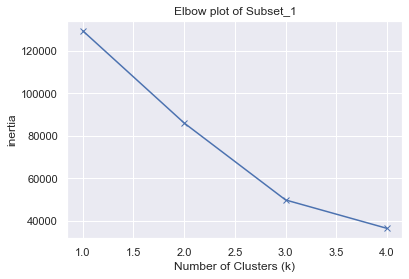

In [199]:
elbow_plot(subset[0],'1',1,5)

#Applying KMeans to make two clusters

In [75]:
k1 = Km(subset[0],2)
k11 = Km(subset[0],3)

#Visualizing the graph with 2 clusters

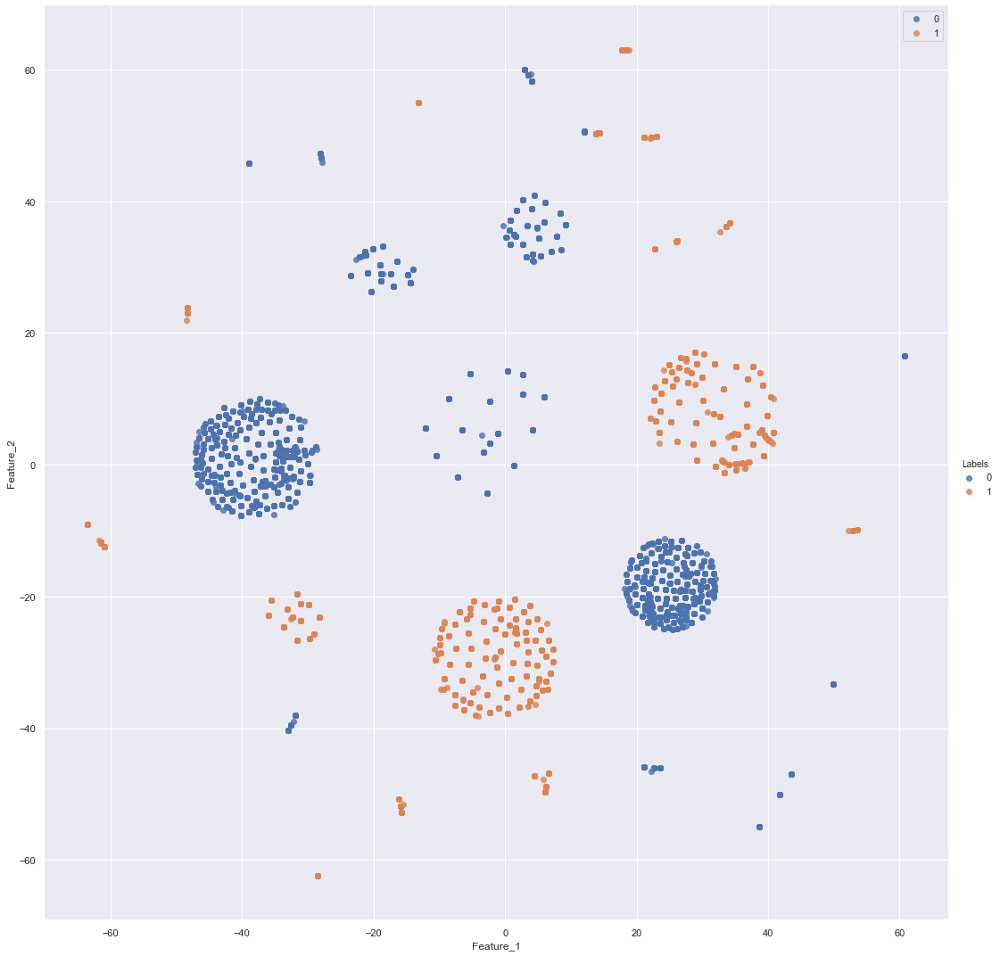

In [178]:
x.text = [f'Age: {a}, Personal: {b}, Education: {d}, Housing: {g}' for a,b,d,g in list(zip(age, personal,education,housing))]
print_graph(tsne[0],k1.labels_,'Clients_Subset_1_cluster_2',x.text)
visu(tsne[0],k1.labels_)

#Visualizing the graph with 3 clusters

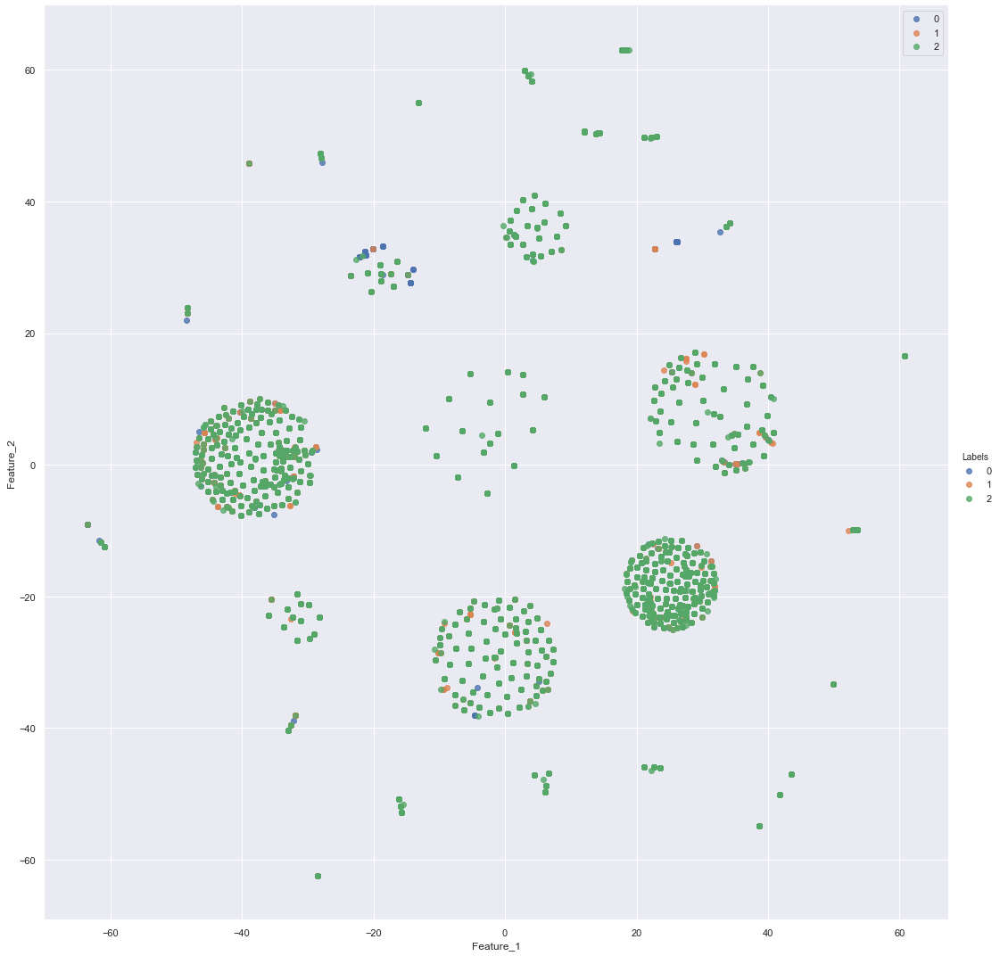

In [179]:
x.text = [f'Age: {a}, Personal: {b}, Education: {d}, Housing: {g}' for a,b,d,g in list(zip(age, personal,education,housing))]
print_graph(tsne[0],k11.labels_,'Clients_Subset_1_cluster_3',x.text)
visu(tsne[0],k11.labels_)

# Visualization Subset 2


#Elbow Plot

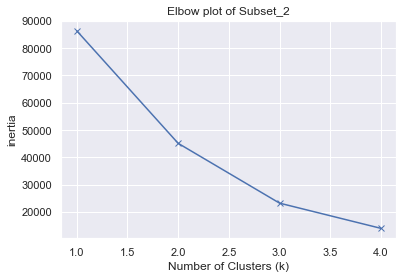

In [200]:
elbow_plot(subset[1],'2',1,5)

#Applying KMeans to make two clusters

In [84]:
k2 = Km(subset[1],2)

#Visualizing the graph with 2 clusters

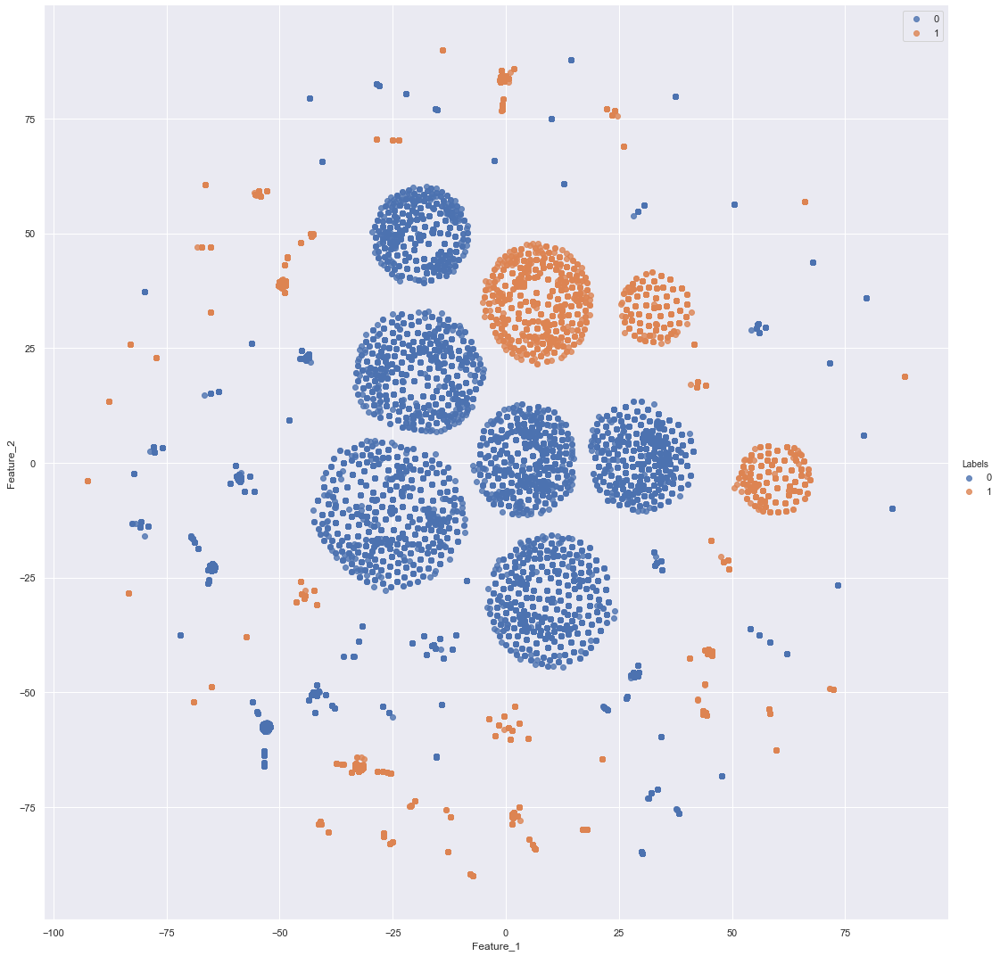

In [180]:
x.text = [f'Age: {a}, Job: {b}, Education: {d}, Balance: {g}' for a,b,d,g in list(zip(age, job,education,balance))]

print_graph(tsne[1],k2.labels_,'Clients_Subset_2_cluster_2',x.text)
visu(tsne[1],k2.labels_)

# Visualization of Subset 3

#Elbow Plot

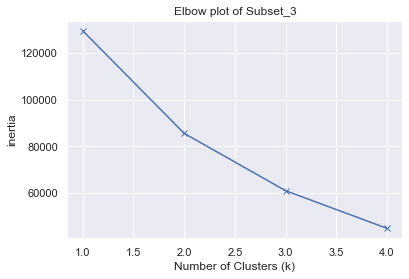

In [201]:
elbow_plot(subset[2],'3',1,5)

#Applying KMeans to make two clusters

In [87]:
k3 = Km(subset[2],2)

#Visualizing the graph with 2 clusters

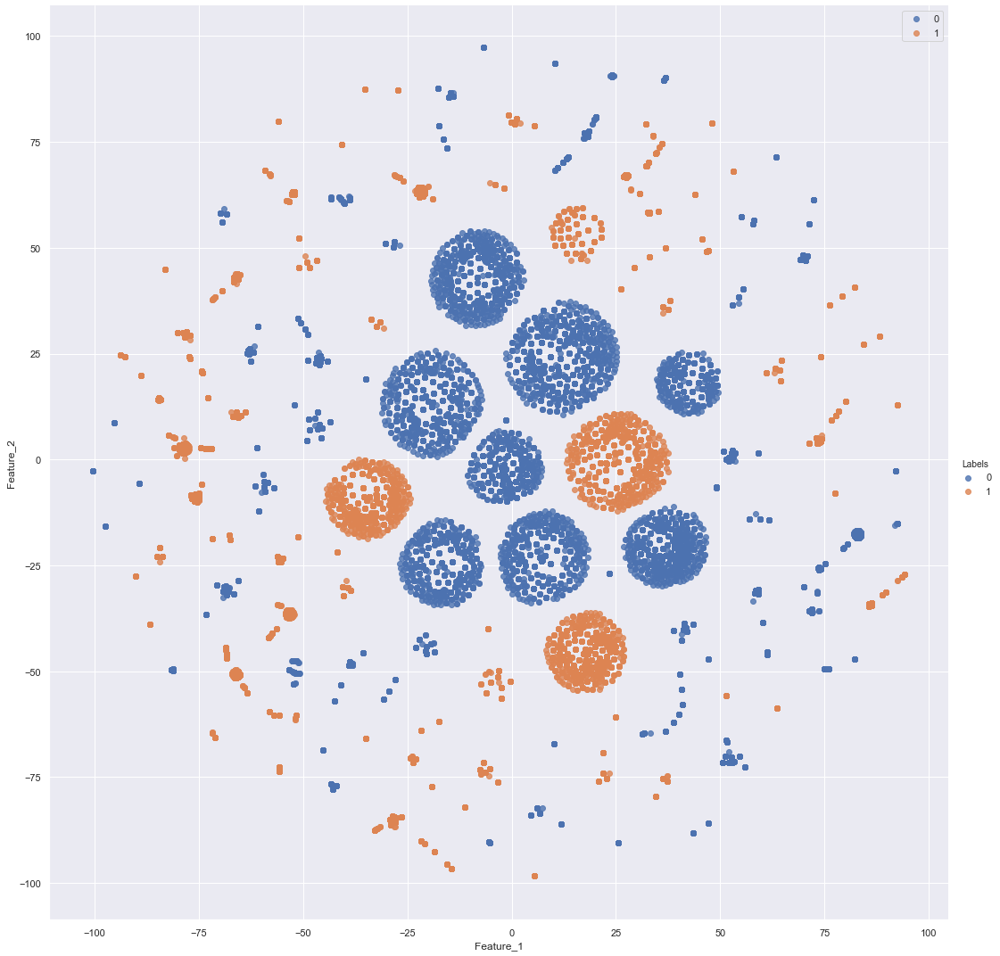

In [181]:
x.text = [f'Age: {a}, Job: {b}, Education: {d}, Balance: {g}, Housing: {c}' for a,b,d,g,c in list(zip(age, job,education,balance,housing))]

print_graph(tsne[2],k3.labels_,'Clients_Subset_3_cluster_2',x.text)
visu(tsne[2],k3.labels_)

# Visualization of Subset 4

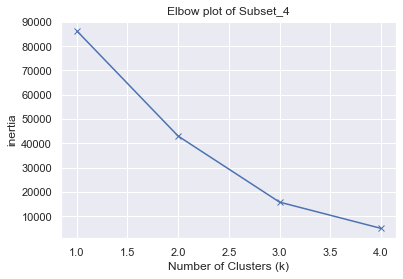

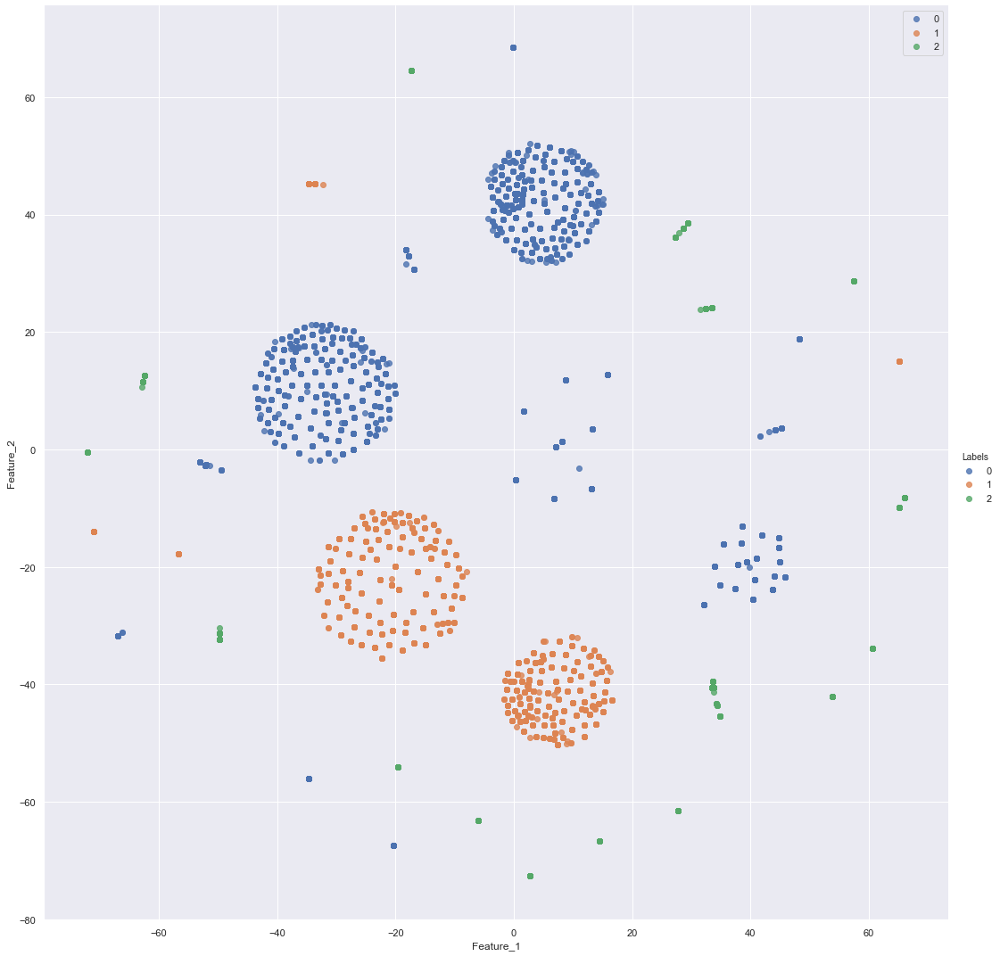

In [203]:
#Elbow Plot
elbow_plot(subset[3],'4',1,5)
#Applying KMeans to make 3 clusters

k4 = Km(subset[3],3)
#Visualizing the graph with 3 clusters

x.text = [f'term: {a}, age: {b}, Education: {d}, Balance: {g}' for a,b,d,g in list(zip(term, age,education,balance))]

print_graph(tsne[3],k4.labels_,'Clients_Subset_4_cluster_3',x.text)
visu(tsne[3],k4.labels_)

# Visualization of Subset 5

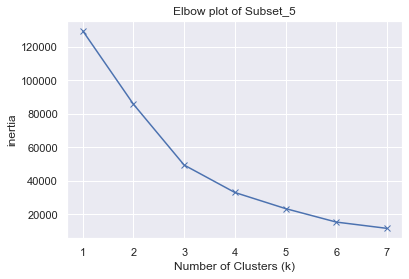

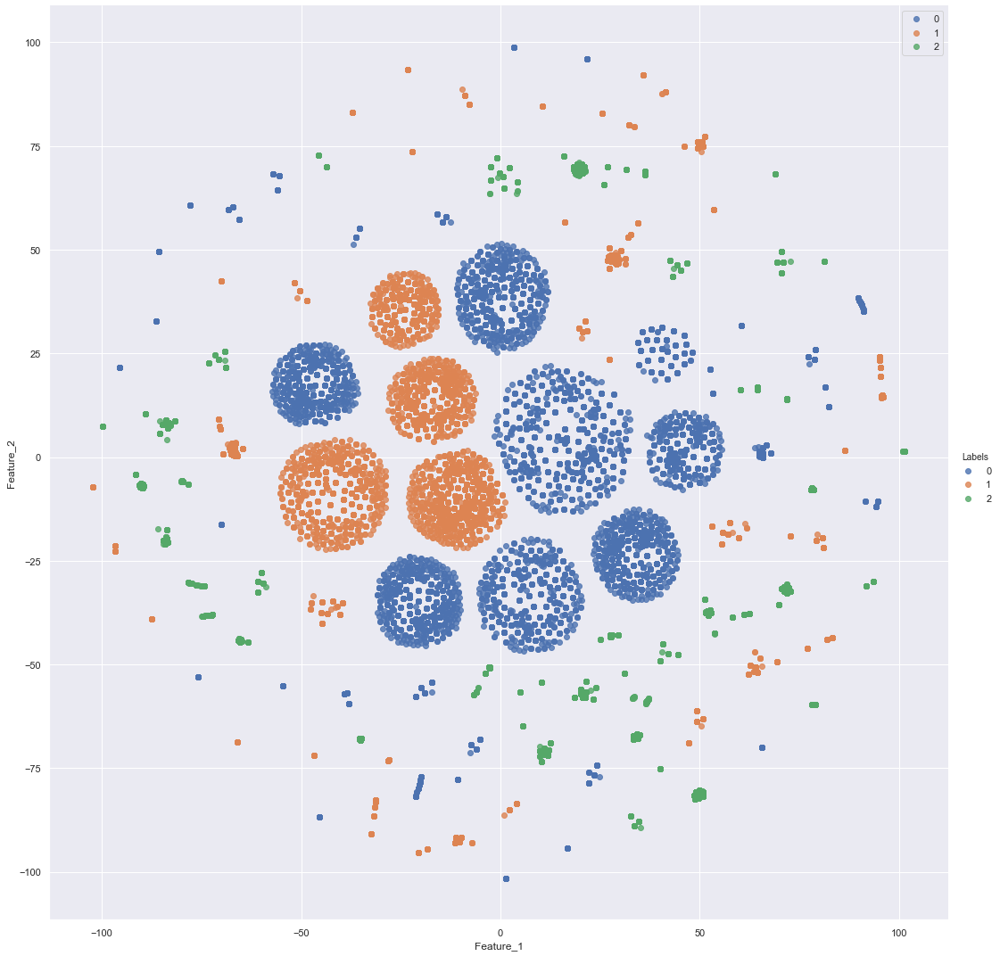

In [205]:
#Elbow Plot
elbow_plot(subset[4],'5',1,8)
#Applying KMeans to make 3 clusters

k5 = Km(subset[4],3)
#Visualizing the graph with 3 clusters

x.text = [f'Personal: {a}, Housing: {b}, Age: {d}, Balance: {g}, Job: {c}' for a,b,d,g,c in list(zip(personal,housing, age,balance,job))]

print_graph(tsne[4],k5.labels_,'Clients_Subset_5_cluster_3',x.text)
visu(tsne[4],k5.labels_)

# Visualization of Subset 6

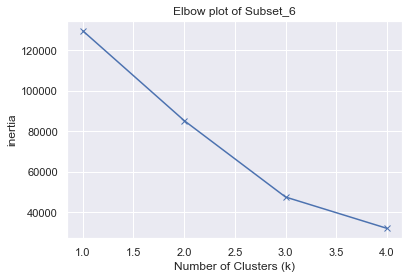

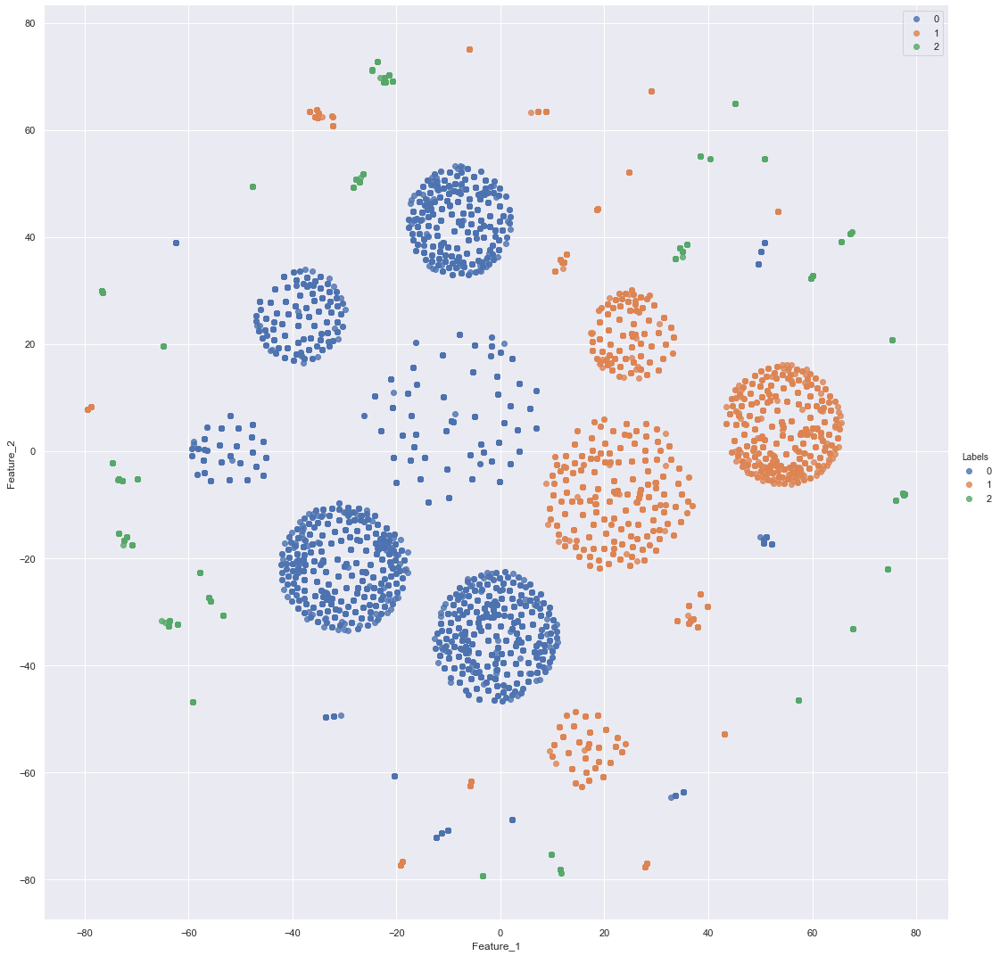

In [207]:
#Elbow Plot
elbow_plot(subset[5],'6',1,5)
#Applying KMeans to make 3 clusters

k6 = Km(subset[5],3)
#Visualizing the graph with 3 clusters

x.text = [f'Term: {a}, Housing: {b}, Education: {d}, Balance: {g}, Age: {c}' for a,b,d,g,c in list(zip(term,housing,education,balance, age))]

print_graph(tsne[5],k6.labels_,'Clients_Subset_6_cluster_3',x.text)
visu(tsne[5],k6.labels_)

# Visualization of Subset 7

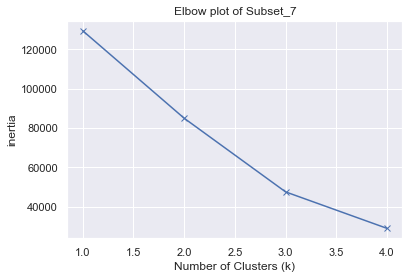

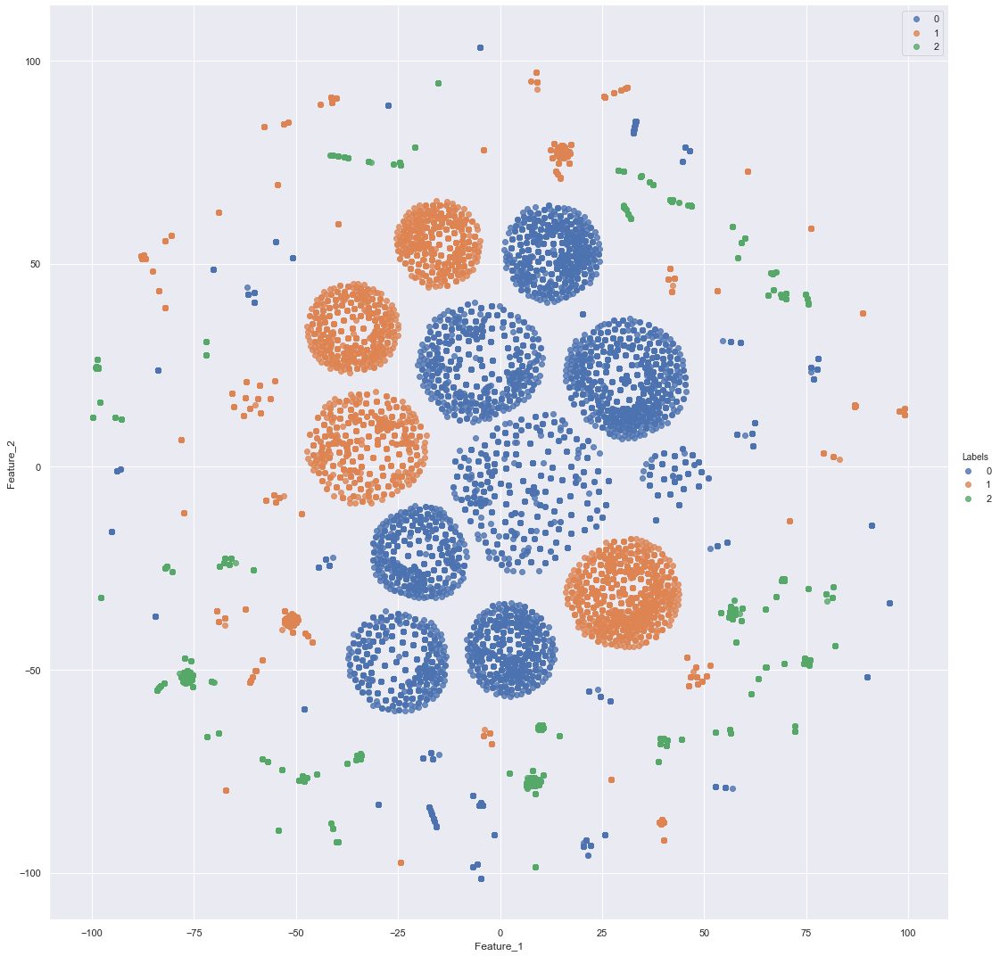

In [209]:
#Elbow Plot
elbow_plot(subset[6],'7',1,5)
#Applying KMeans to make 3 clusters

k7 = Km(subset[6],3)
#Visualizing the graph with 3 clusters

x.text = [f'Term: {a}, Housing: {b}, Job: {d}, Balance: {g}, Age: {c}' for a,b,d,g,c in list(zip(term,housing,job,balance, age))]

print_graph(tsne[6],k7.labels_,'Clients_Subset_7_cluster_3',x.text)
visu(tsne[6],k7.labels_)

# Visualization of Subset 8

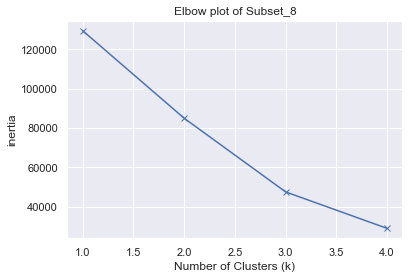

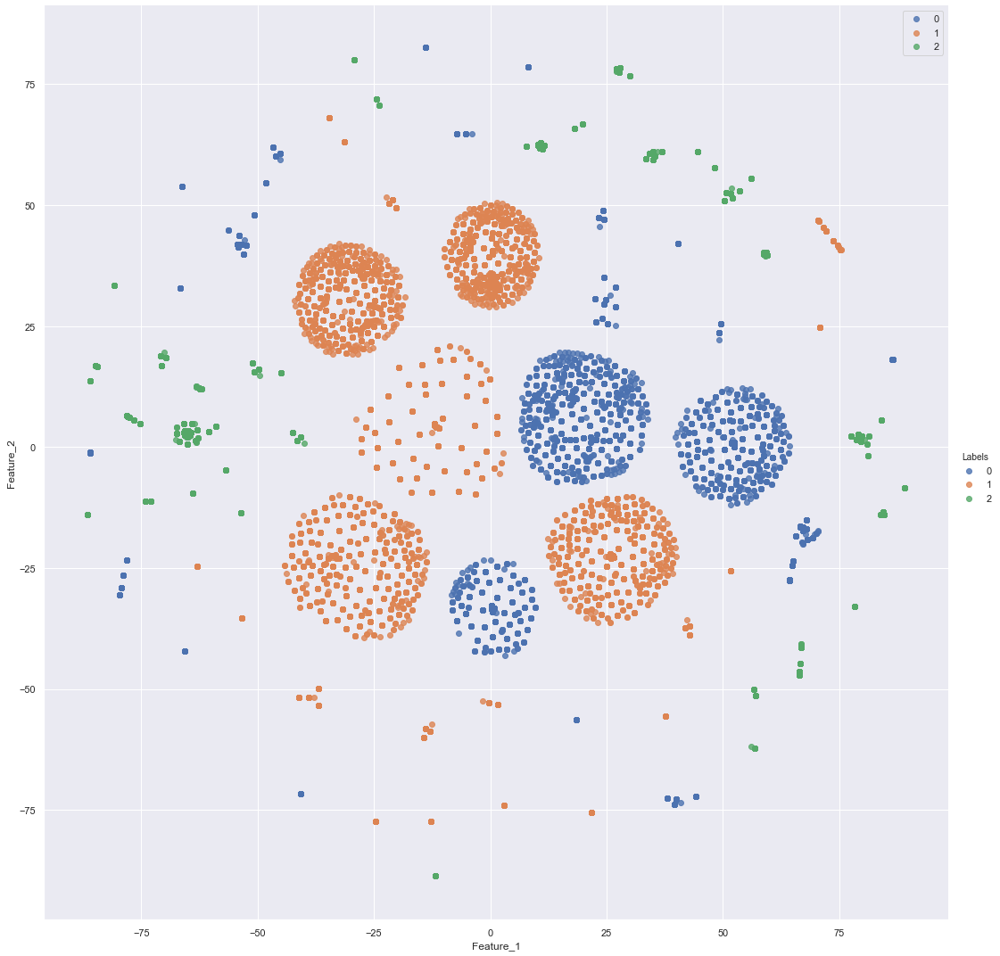

In [211]:
#Elbow Plot
elbow_plot(subset[7],'8',1,5)
#Applying KMeans to make 3 clusters

k8 = Km(subset[7],3)
#Visualizing the graph with 3 clusters

x.text = [f'Term: {a}, Housing: {b}, Job: {d}, Age: {c}' for a,b,d,c in list(zip(term,housing,job,age))]

print_graph(tsne[7],k8.labels_,'Clients_Subset_8_cluster_3',x.text)
visu(tsne[7],k8.labels_)

# Visualization of Subset 9

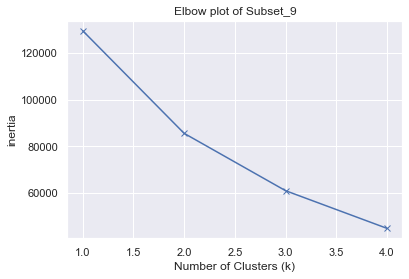

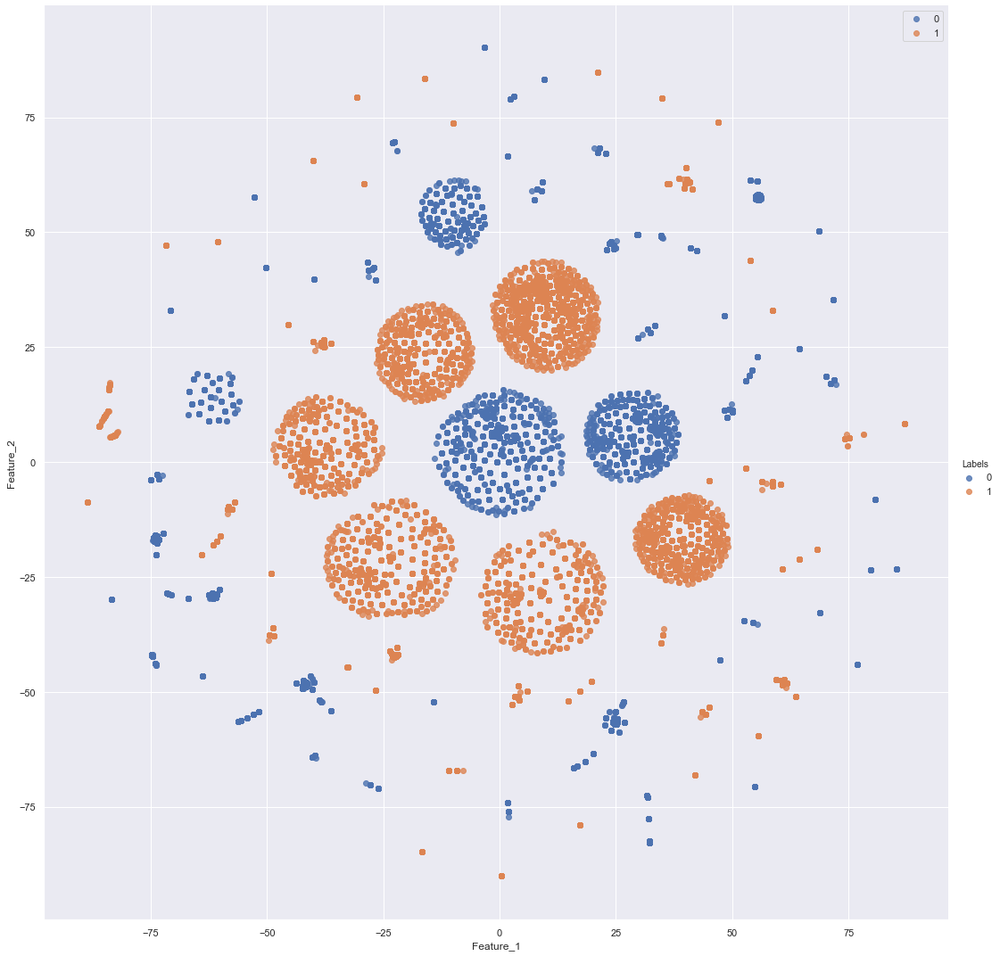

In [214]:
#Elbow Plot
elbow_plot(subset[8],'9',1,5)
#Applying KMeans to make 2 clusters

k9 = Km(subset[8],2)
#Visualizing the graph with 2 clusters

x.text = [f'Education: {a}, Housing: {b}, Job: {d}, Age: {c}' for a,b,d,c in list(zip(education,housing,job,age))]

print_graph(tsne[8],k9.labels_,'Clients_Subset_9_cluster_2',x.text)
visu(tsne[8],k9.labels_)

# Visualization of Subset 10

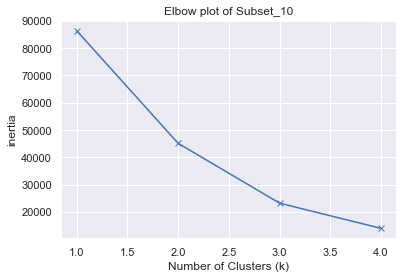

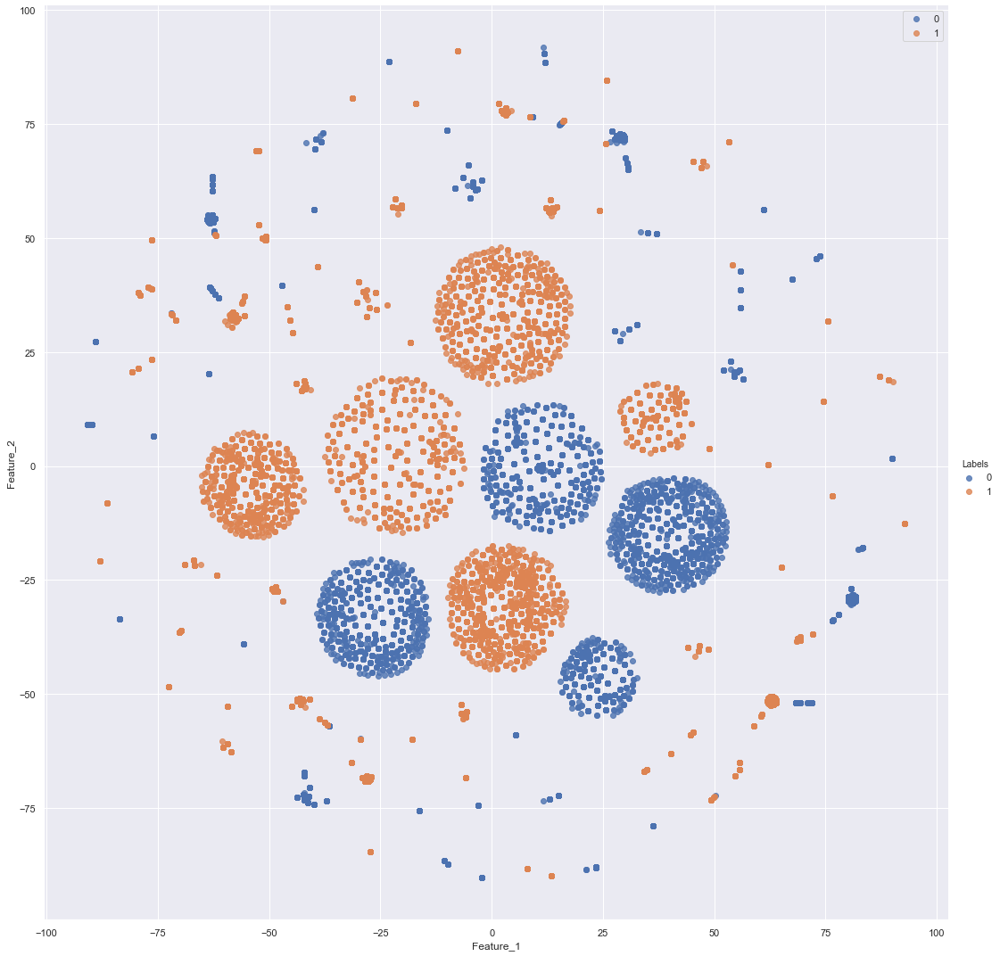

In [216]:
#Elbow Plot
elbow_plot(subset[9],'10',1,5)
#Applying KMeans to make 2 clusters

k10 = Km(subset[9],2)
#Visualizing the graph with 2 clusters

x.text = [f'Education: {a}, Balance: {b}, Job: {d}, Age: {c}' for a,b,d,c in list(zip(education,balance,job,age))]
print_graph(tsne[9],k10.labels_,'Clients_Subset_10_cluster_2',x.text)
visu(tsne[9],k10.labels_)

# Visualization of Subset 11

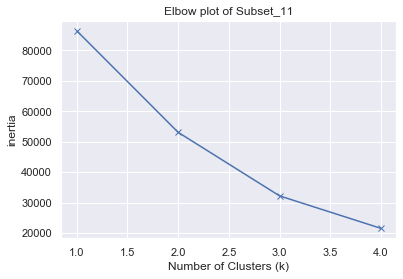

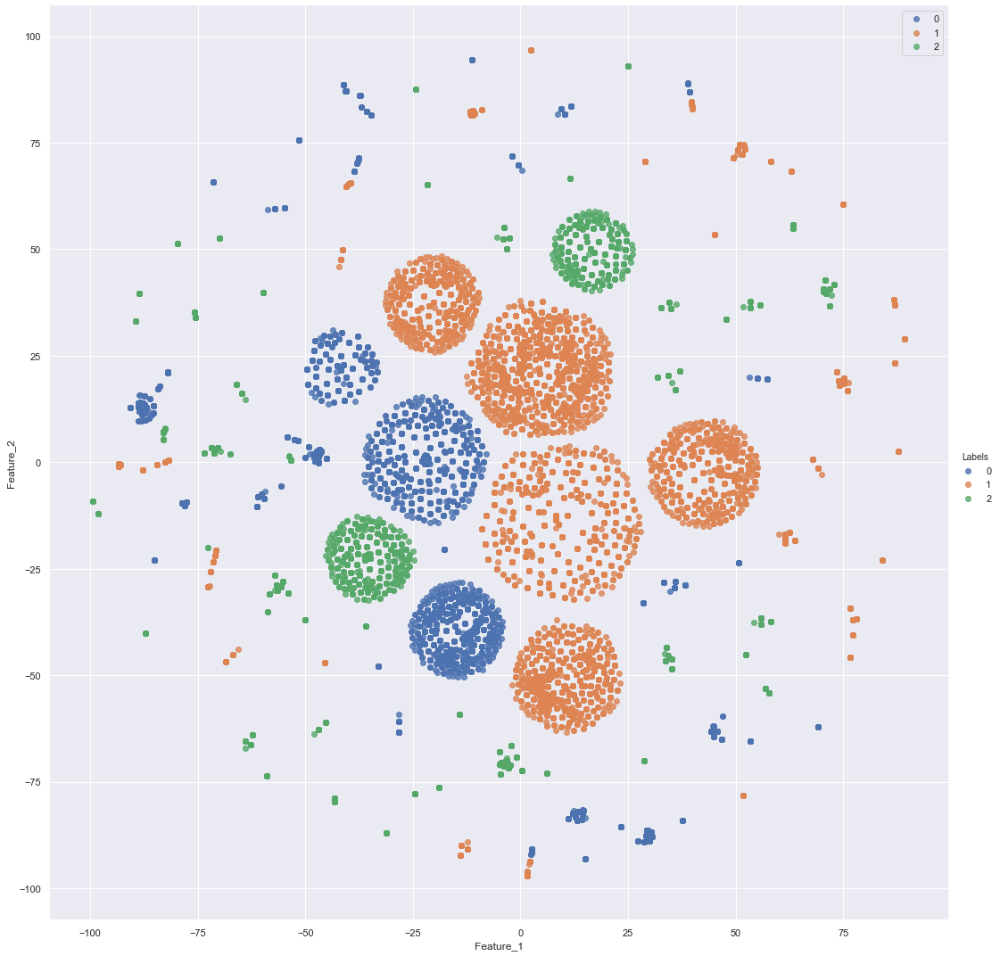

In [217]:
#Elbow Plot
elbow_plot(subset[10],'11',1,5)
#Applying KMeans to make 3 clusters

k11 = Km(subset[10],3)
#Visualizing the graph with 3 clusters

x.text = [f'Marital: {a}, Housing: {b}, Job: {d}, Age: {c}' for a,b,d,c in list(zip(marital,housing,job,age))]

print_graph(tsne[10],k11.labels_,'Clients_Subset_11_cluster_3',x.text)
visu(tsne[10],k11.labels_)

# Visualization of Subset 12

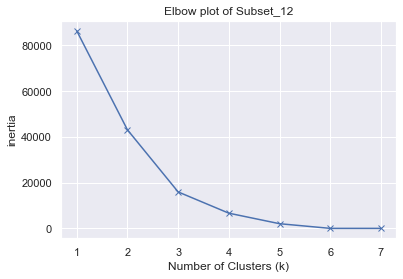

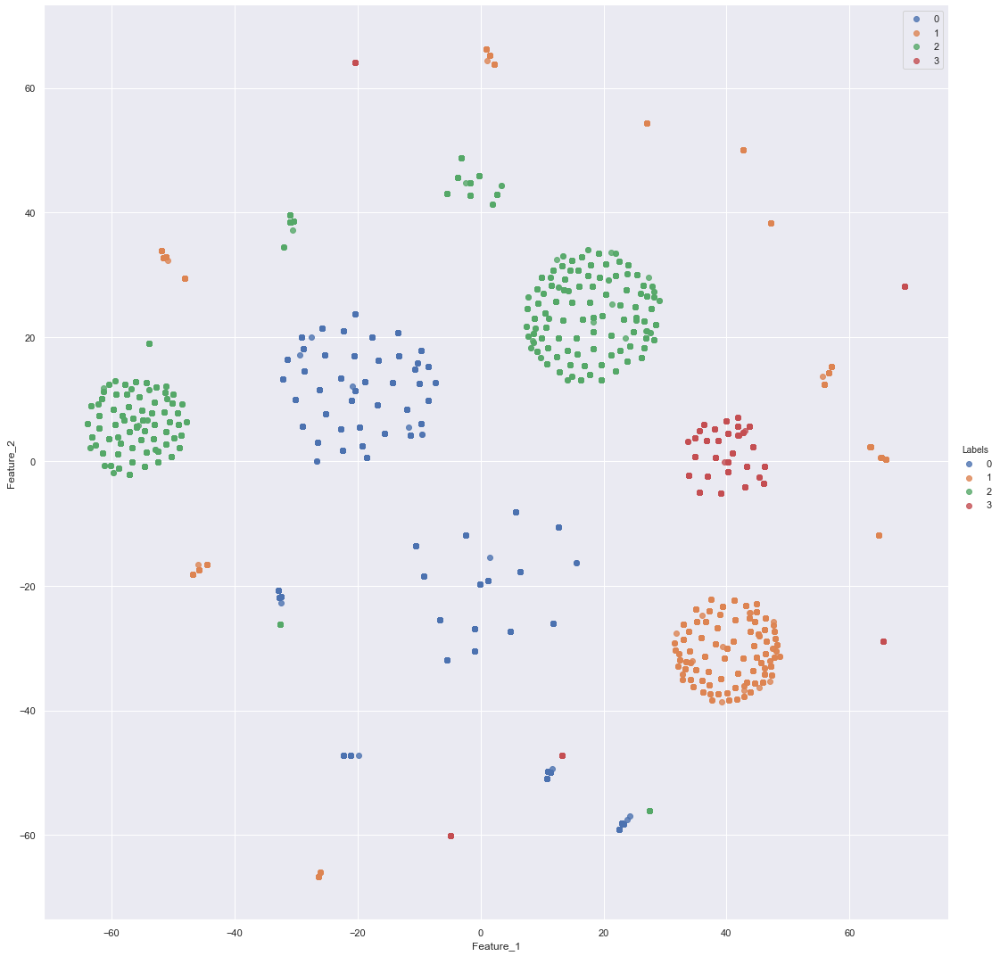

In [219]:
#Elbow Plot
elbow_plot(subset[11],'12',1,8)
#Applying KMeans to make 4 clusters

k12 = Km(subset[11],4)
#Visualizing the graph with 4 clusters

x.text = [f'Marital: {a}, Housing: {b}, Personal: {d}, Age: {c}' for a,b,d,c in list(zip(marital,housing,personal,age))]

print_graph(tsne[11],k12.labels_,'Clients_Subset_12_cluster_4',x.text)
visu(tsne[11],k12.labels_)

# Visualization of Subset 13

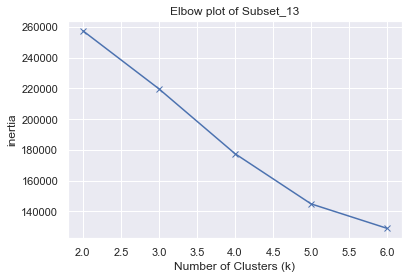

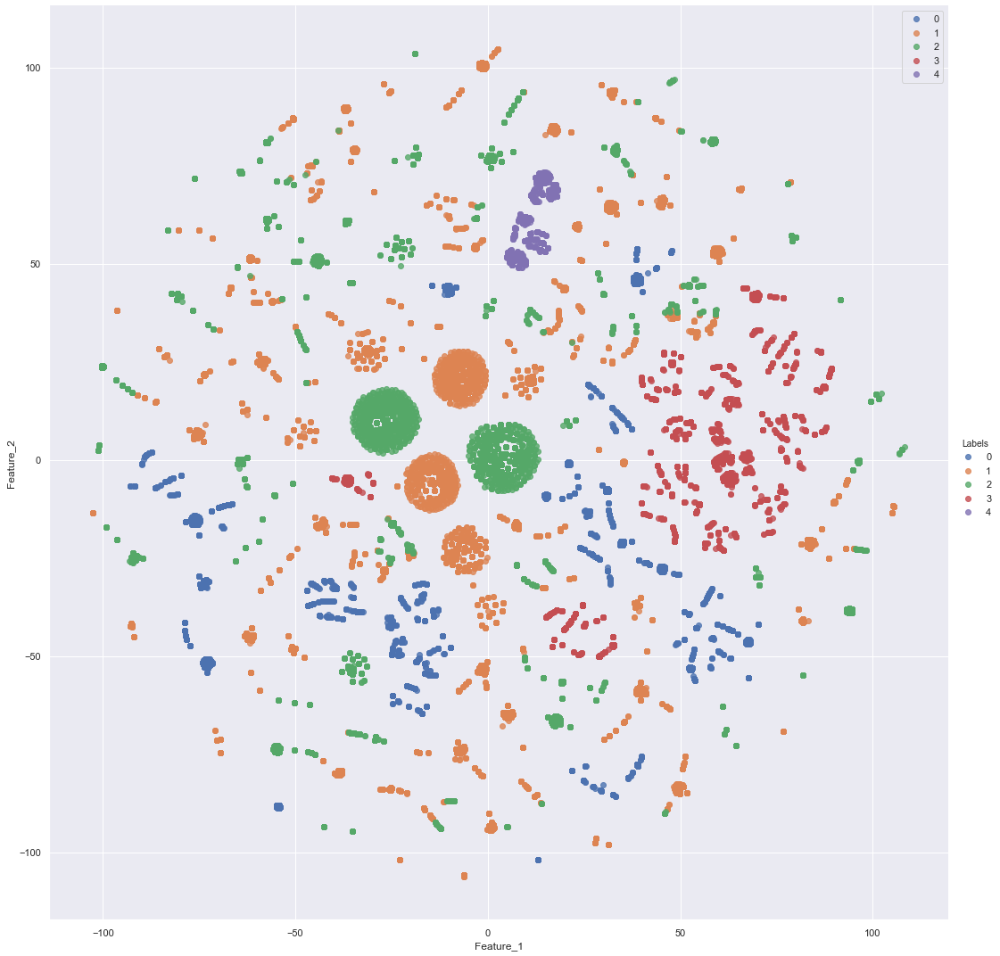

In [222]:
#Elbow Plot
elbow_plot(subset[12],'13',2,7)
#Applying KMeans to make 5 clusters

k13 = Km(subset[12],5)
#Visualizing the graph with 5 clusters

x.text = [f'Age: {a}, Personal: {b}, Marital: {c}, Education: {d}, Job: {e}, Balance: {f}, Housing: {g}, Term: {h}' for a,b,c,d,e,f,g,h in list(zip(age, personal, marital, education,job,balance,housing,term))]
print_graph(tsne[12],k13.labels_,'Clients_Subset_13_cluster_5',x.text)
visu(tsne[12],k13.labels_)

# Dataset Patches

# Importing dataset and examining it

In [31]:
f = "Patches.csv"
data_p = Data(f)
Examin(data_p)



Head


   Elevation  Slope  Horizontal_Distance_To_Hydrology  \
0       2596      3                               258   
1       2590      2                               212   
2       2804      9                               268   
3       2785     18                               242   
4       2595      2                               153   

   Vertical_Distance_To_Hydrology  Horizontal_Distance_To_Roadways  \
0                               0                              510   
1                              -6                              390   
2                              65                             3180   
3                             118                             3090   
4                              -1                              391   

   Horizontal_Distance_To_Fire_Points   Tree  
0                                6279  Other  
1                                6225  Other  
2                                6121  Other  
3                                6211  

#As we can see above, there is only Six columns with Numerical Values and one column with Nominal or Categorical values.

# Converting Nominal Values to Numerical Values

In [32]:
converter = le()
data_p['Tree'] = converter.fit_transform(data_p['Tree'].astype(str))

In [33]:
print(data_p.head())
Examin(data_p[['Tree']])

   Elevation  Slope  Horizontal_Distance_To_Hydrology  \
0       2596      3                               258   
1       2590      2                               212   
2       2804      9                               268   
3       2785     18                               242   
4       2595      2                               153   

   Vertical_Distance_To_Hydrology  Horizontal_Distance_To_Roadways  \
0                               0                              510   
1                              -6                              390   
2                              65                             3180   
3                             118                             3090   
4                              -1                              391   

   Horizontal_Distance_To_Fire_Points  Tree  
0                                6279     0  
1                                6225     0  
2                                6121     0  
3                                6211     0  
4     

# Visualization to better understand the data
#As there is no null values in the dataset

# Countplot of categorical column

In [107]:
data_s = data_p.copy()
data_s.columns = ['Elevation','Slope','HDTH',
                     'VDTH','HDTR','HDTFP','Tree']

def Slope_s(x):
    if x <= 15:
        return 0 
    elif (x >15 and x <=30):
        return 1
    else:
        return 2
def Elevation_e(x):
    if x <= 2500:
        return 0 
    elif (x >2500 and x <=3000):
        return 1
    else:
        return 2


data_s['Elevation'] = data_s['Elevation'].apply(Elevation_e)
data_s['Slope'] = data_s['Slope'].apply(Slope_s)
Z_s = data_s.copy()
print(Z_s.head())
print(Z_s.info())

   Elevation  Slope  HDTH  VDTH  HDTR  HDTFP  Tree
0          1      0   258     0   510   6279     0
1          1      0   212    -6   390   6225     0
2          1      0   268    65  3180   6121     0
3          1      1   242   118  3090   6211     0
4          1      0   153    -1   391   6172     0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Elevation  15120 non-null  int64
 1   Slope      15120 non-null  int64
 2   HDTH       15120 non-null  int64
 3   VDTH       15120 non-null  int64
 4   HDTR       15120 non-null  int64
 5   HDTFP      15120 non-null  int64
 6   Tree       15120 non-null  int32
dtypes: int32(1), int64(6)
memory usage: 767.9 KB
None


Tree
0    12960
1     2160
dtype: int64


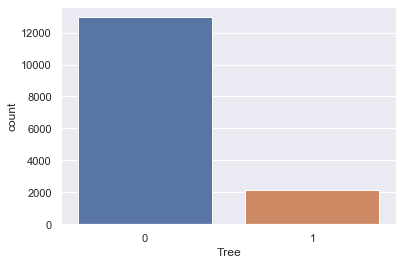

In [64]:
print(Z_s.groupby('Tree').size())
sea.countplot(Z_s['Tree'],label="Count")
py.show()

Slope
0    7667
1    6406
2    1047
dtype: int64


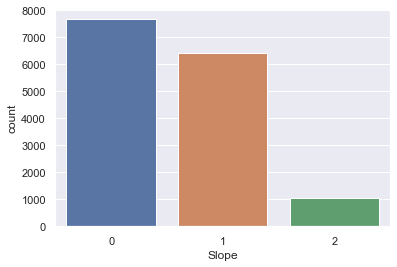

In [65]:
print(Z_s.groupby('Slope').size())
sea.countplot(Z_s['Slope'],label="Count")
py.show()

Elevation
0    5061
1    5434
2    4625
dtype: int64


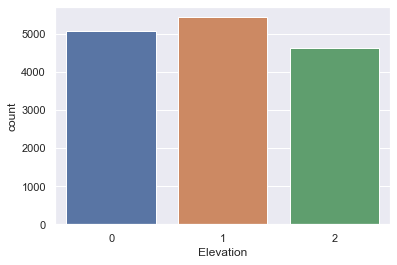

In [66]:
print(Z_s.groupby('Elevation').size())
sea.countplot(Z_s['Elevation'],label="Count")
py.show()

# Pairplot of the dataset as per the 'Tree' Category

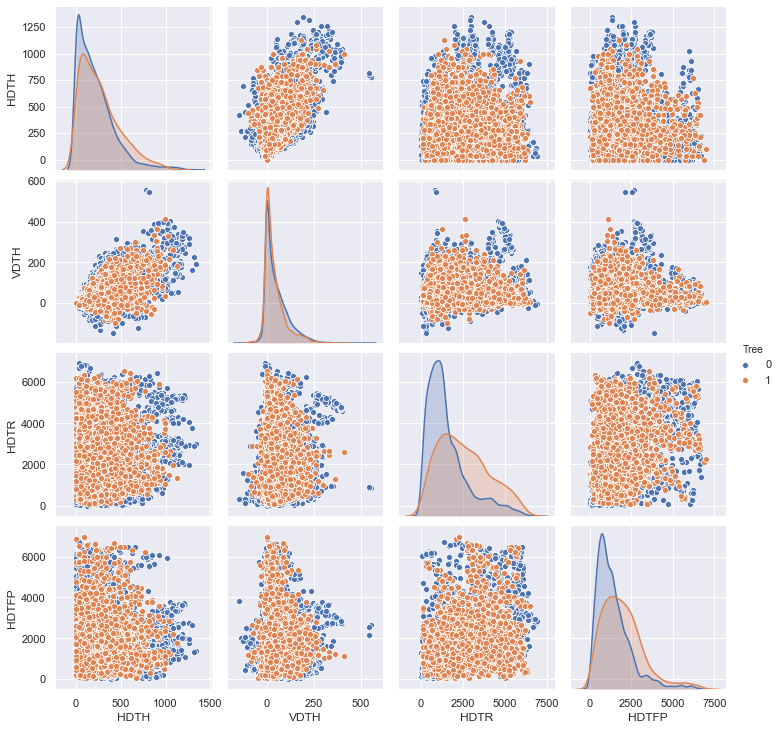

In [84]:
g = sea.pairplot(Z_s.filter(['HDTH','VDTH','HDTR','HDTFP','Tree'],axis=1),hue = 'Tree')

# Pairplot of the dataset as per the 'Elevation' Category

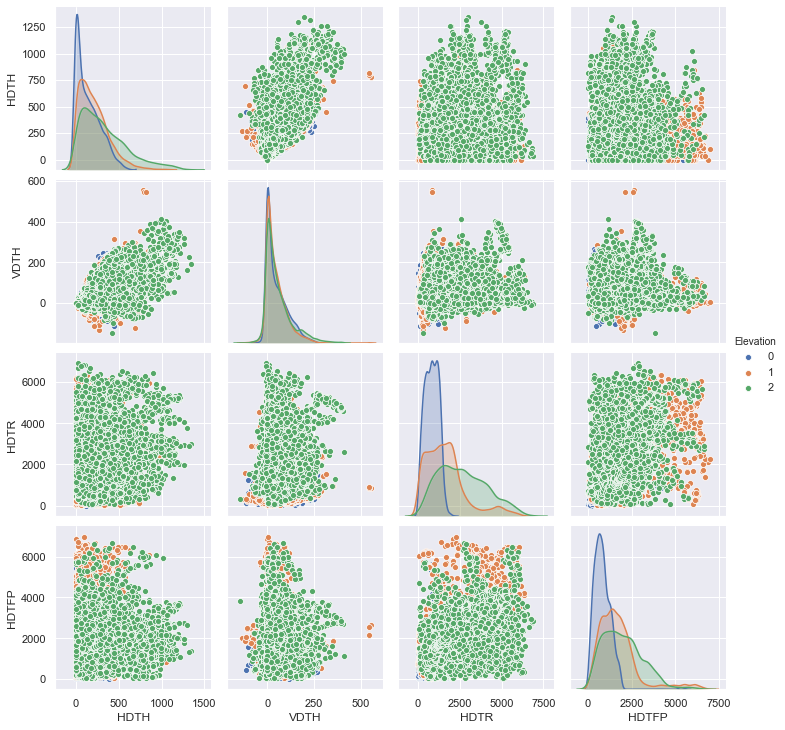

In [85]:
g = sea.pairplot(Z_s.filter(['HDTH','VDTH','HDTR','HDTFP','Elevation'],axis=1),hue = 'Elevation')

# Pairplot of the dataset as per the 'Slope' Category

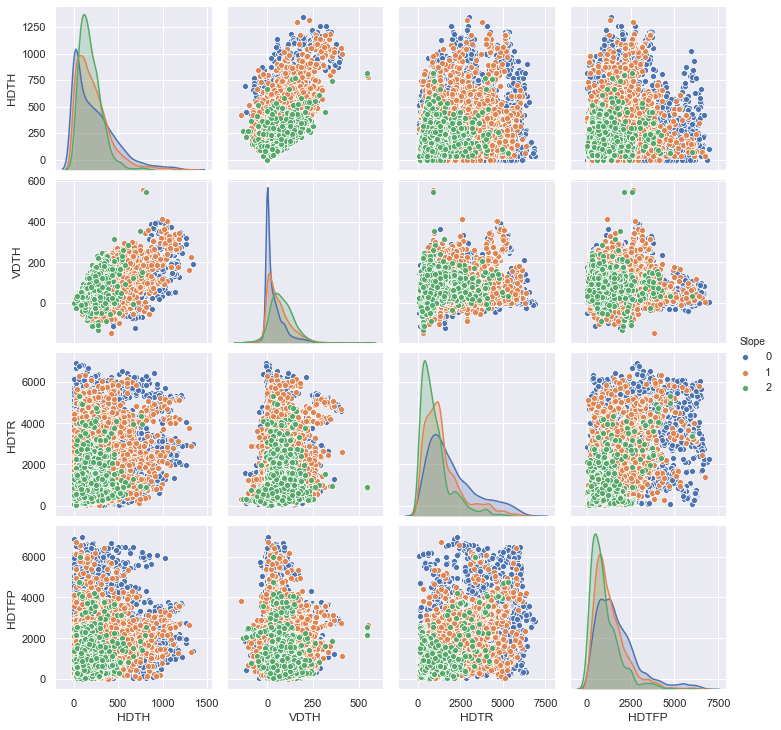

In [86]:
g = sea.pairplot(Z_s.filter(['HDTH','VDTH','HDTR','HDTFP','Slope'],axis=1),hue = 'Slope')

# Scatter Plots

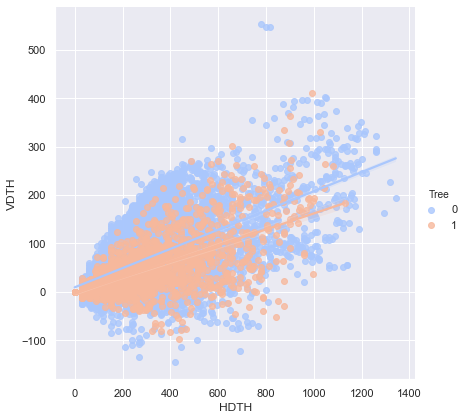

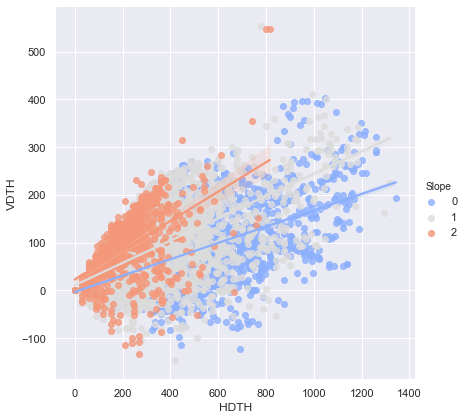

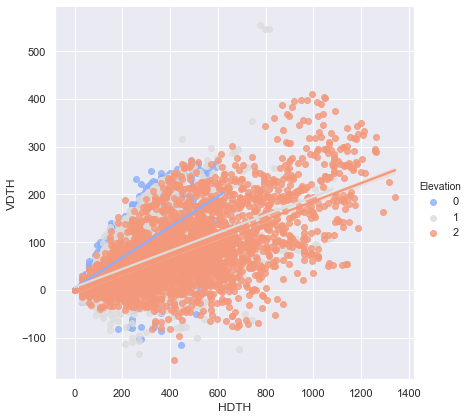

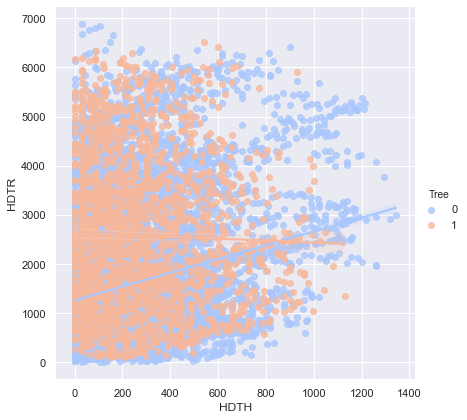

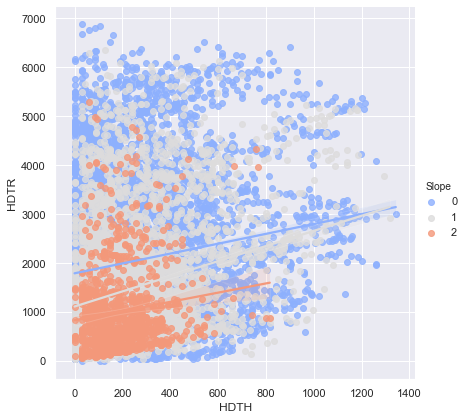

...

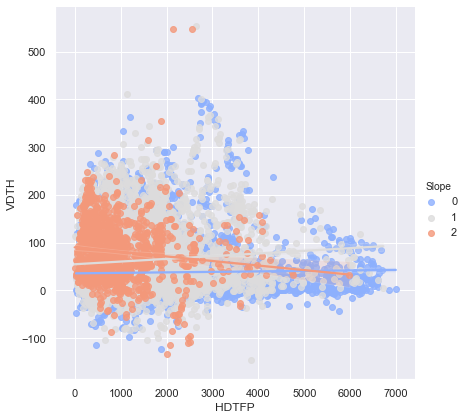

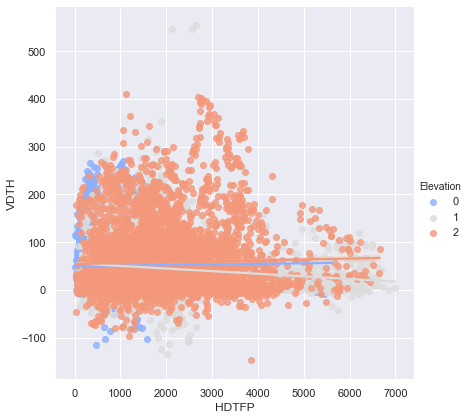

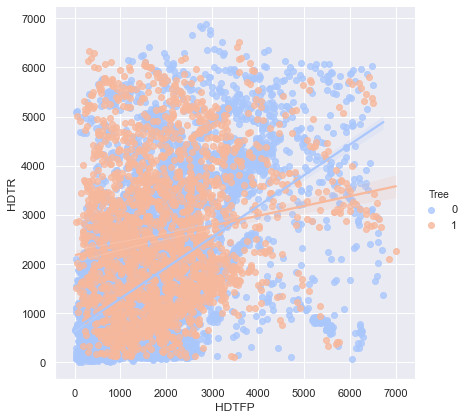

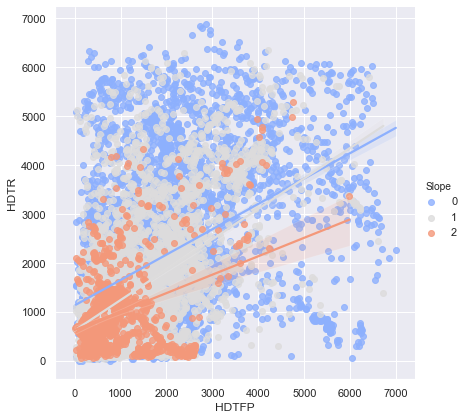

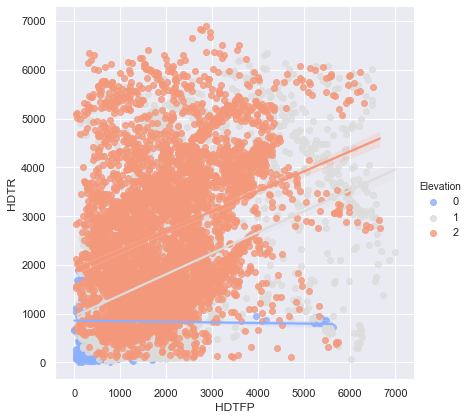

In [87]:
scat = Z_s.filter(['HDTH','VDTH','HDTR','HDTFP','Tree','Slope','Elevation'],axis=1)
s_col = scat.columns
for i in range(0,4):
    for j in range(0,4):
        for z in range(0,3):
            if(i !=j):
                sea.lmplot(s_col[i],s_col[j],data=scat, hue=s_col[4+z],
                           palette='coolwarm',height=6,aspect=1,fit_reg=True) 
        

# Box Plot

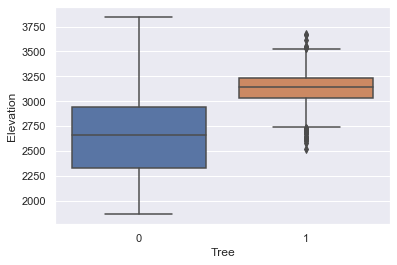

In [92]:
sea.boxplot(x='Tree',y='Elevation',data=data_p)

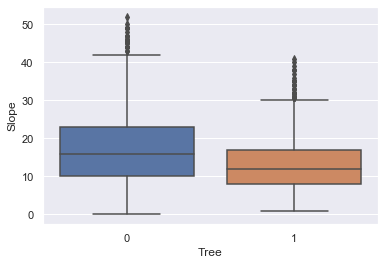

In [93]:
sea.boxplot(x='Tree',y='Slope',data=data_p)

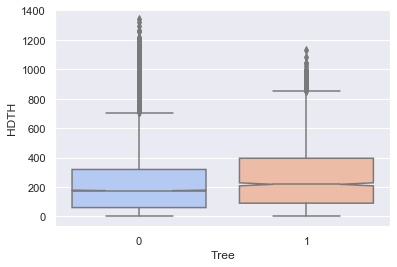

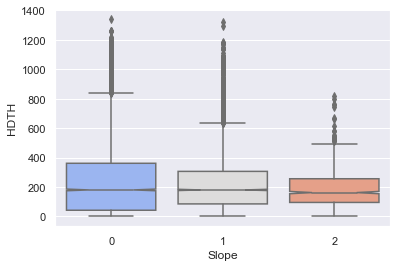

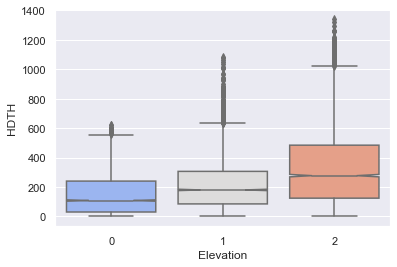

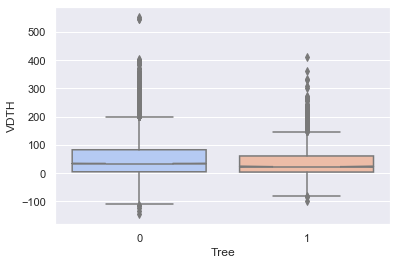

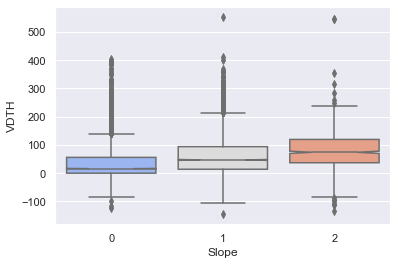

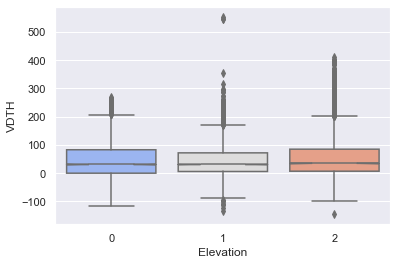

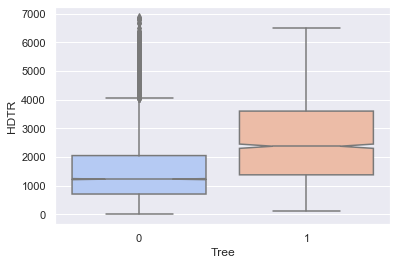

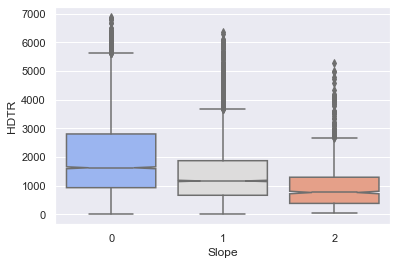

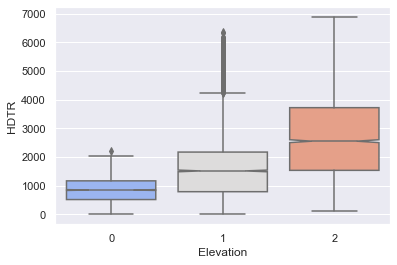

In [100]:
for i in range(0,4):
    for z in range(0,3):
        if(i !=j):
            plot01=sea.boxplot(x=s_col[4+z],y=s_col[i],data=scat,palette='coolwarm',notch=True)
            py.show()

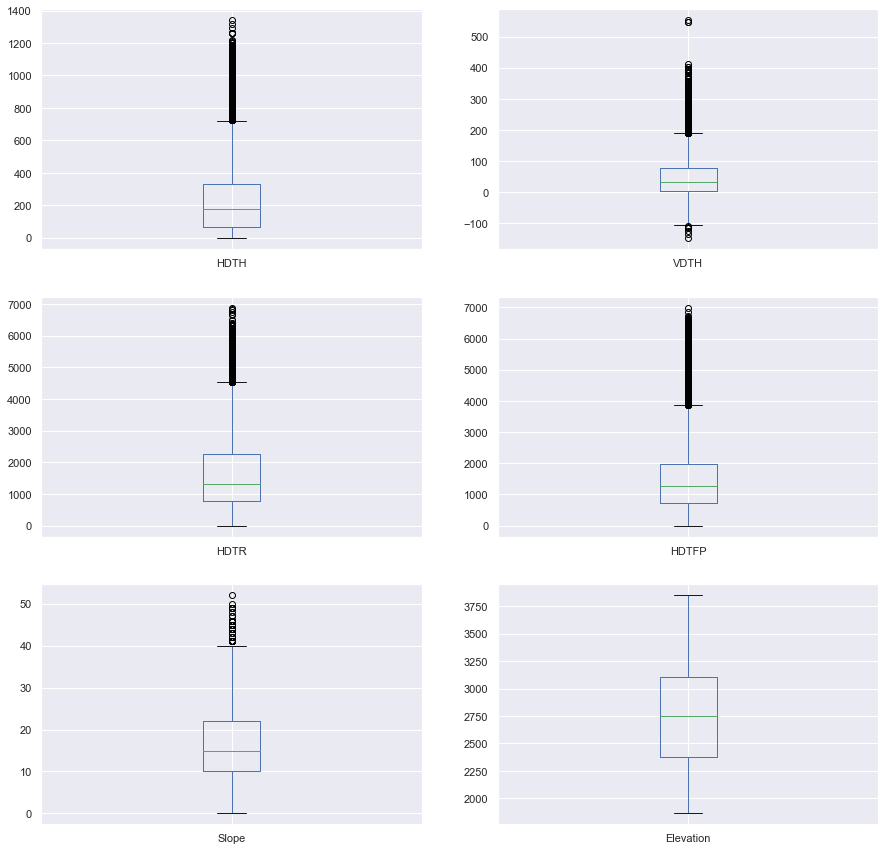

In [91]:
data_s.filter(['HDTH','VDTH','HDTR','HDTFP','Slope','Elevation'],axis=1).plot(kind='box', subplots=True,figsize=(15,15), layout=(3,2), sharex=False, sharey=False)
py.show()

# Histograms

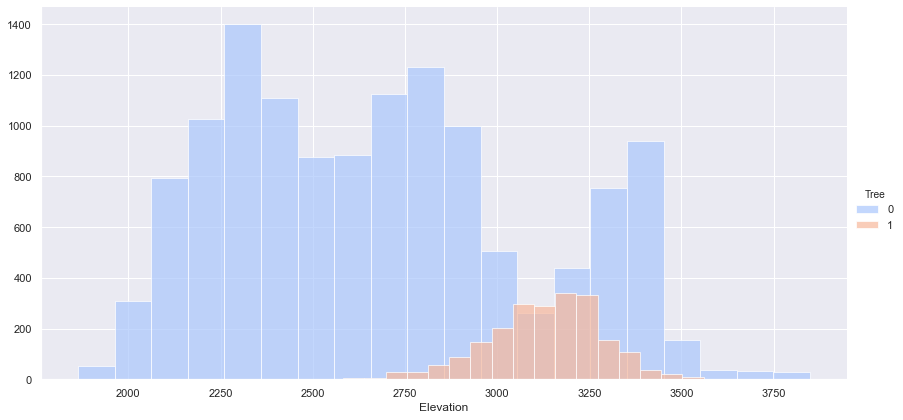

In [104]:
sea.set_style('darkgrid')
g = sea.FacetGrid(data_p,hue="Tree",palette='coolwarm',height=6,aspect=2)
g = g.map(py.hist,'Elevation',bins=20,alpha=0.7).add_legend()

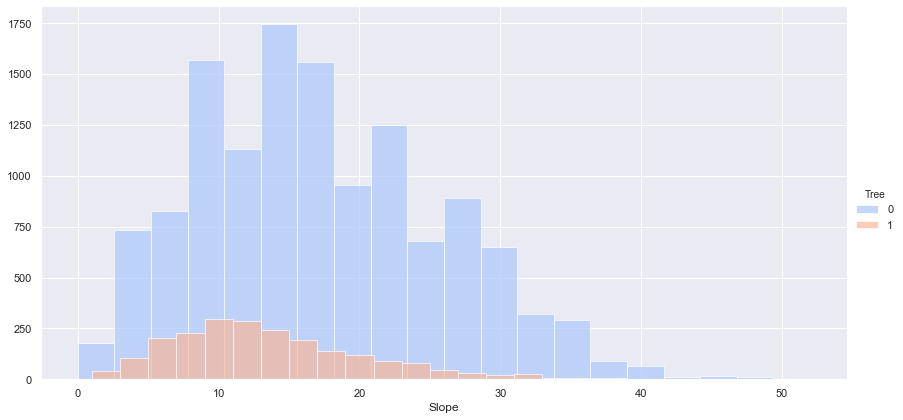

In [105]:
sea.set_style('darkgrid')
g = sea.FacetGrid(data_p,hue="Tree",palette='coolwarm',height=6,aspect=2)
g = g.map(py.hist,'Slope',bins=20,alpha=0.7).add_legend()

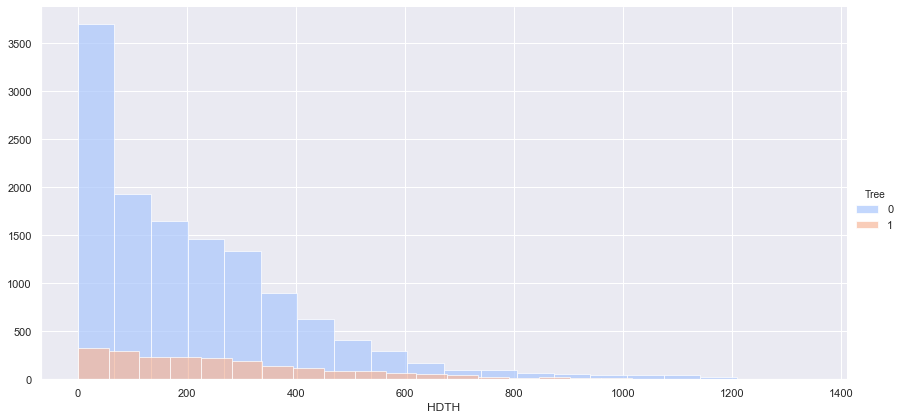

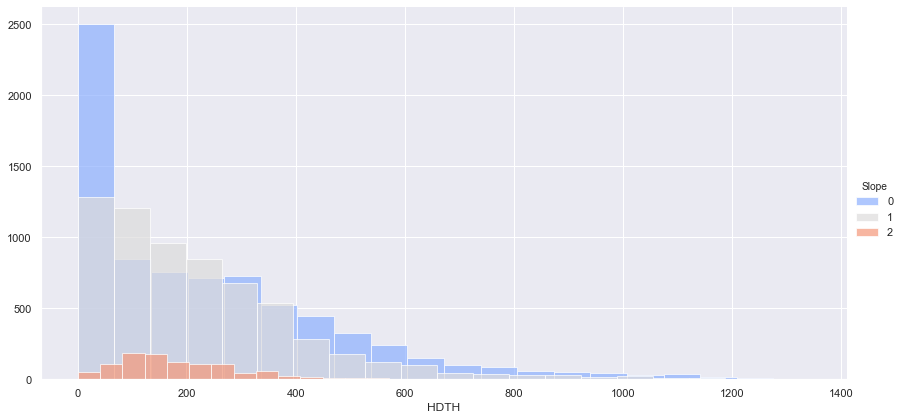

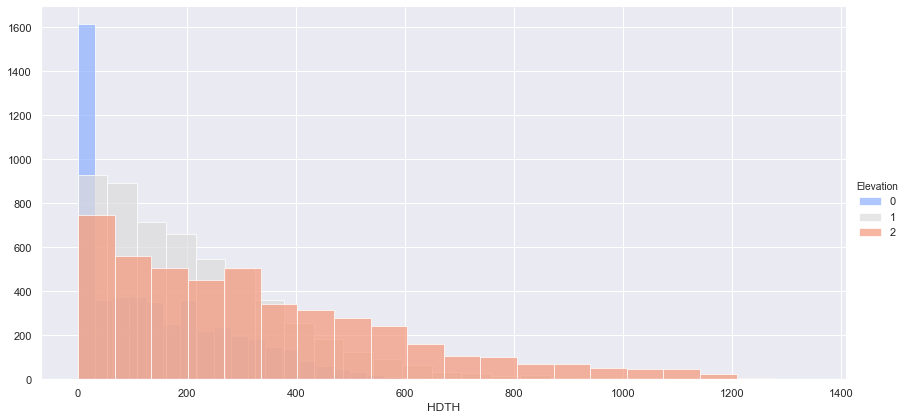

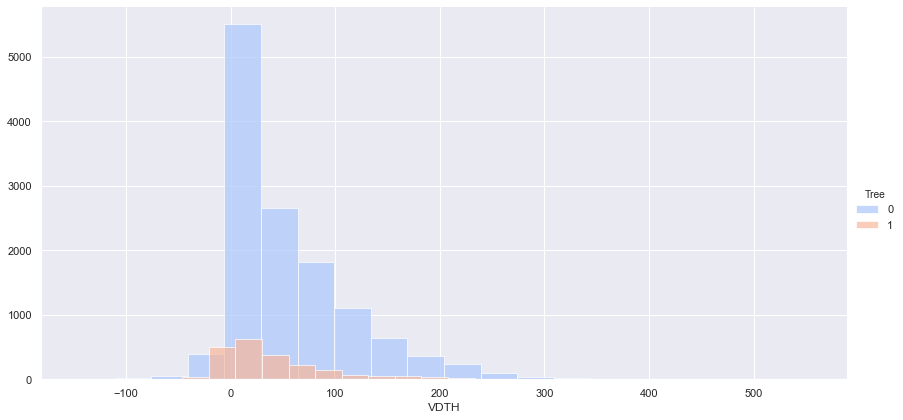

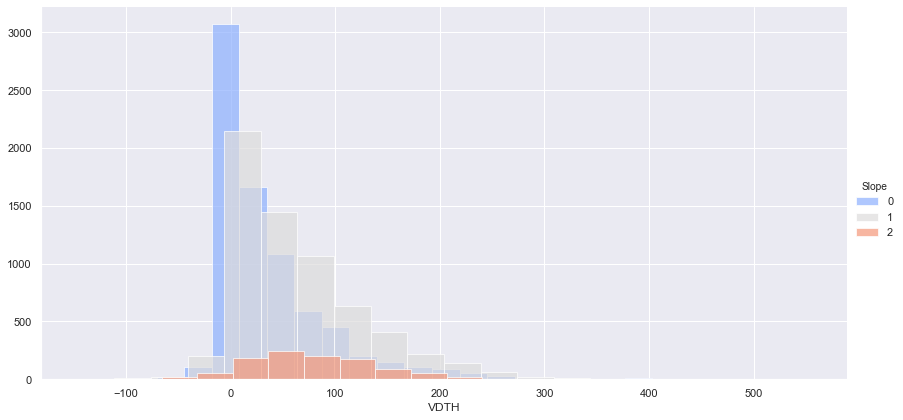

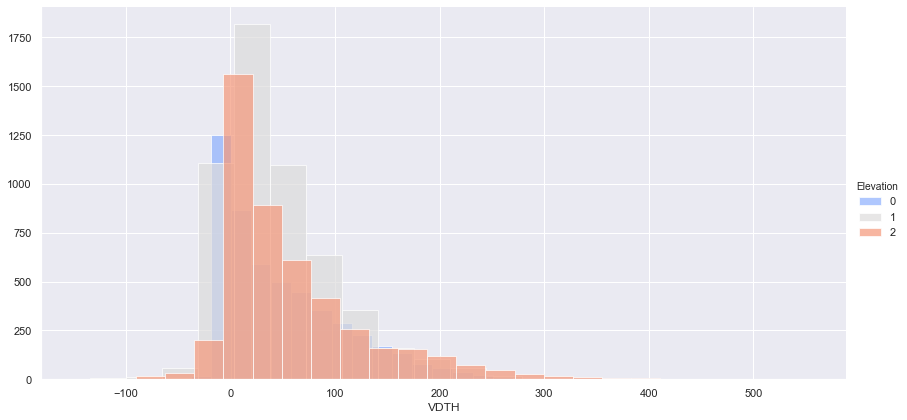

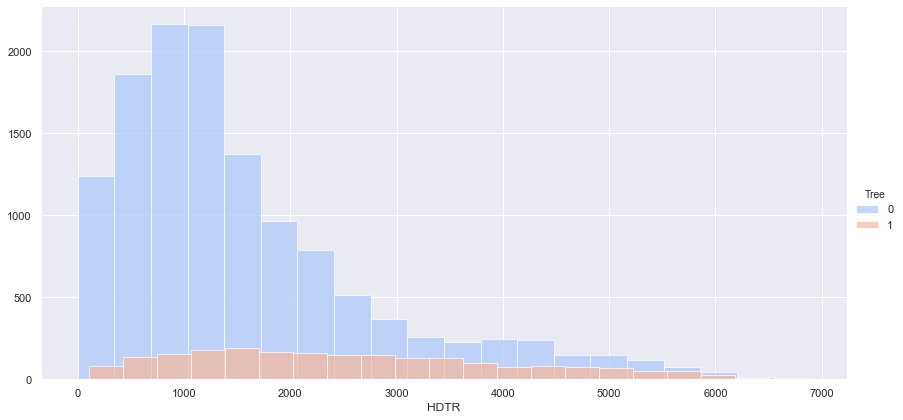

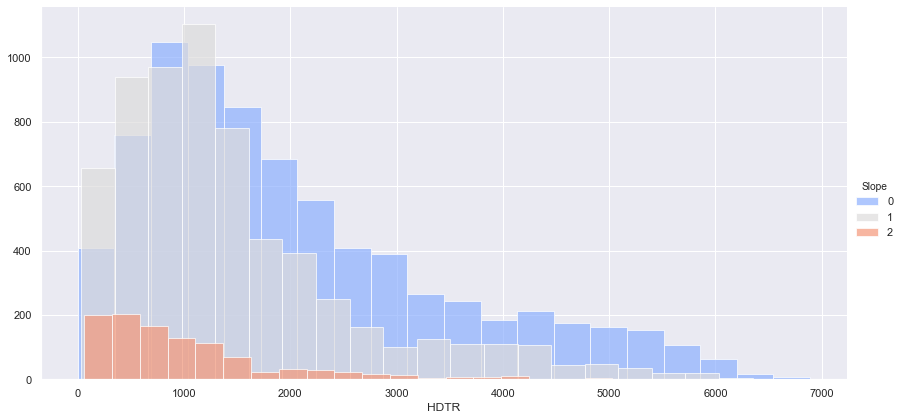

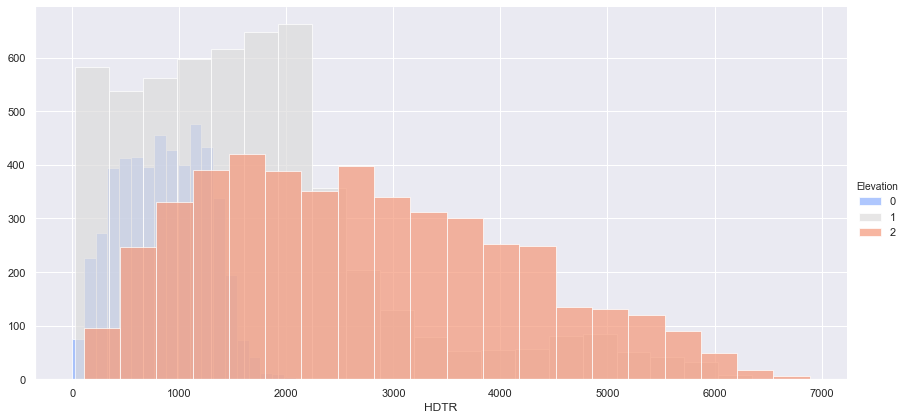

In [106]:
for i in range(0,4):
    for z in range(0,3):
        if(i !=j):
            sea.set_style('darkgrid')
            g = sea.FacetGrid(scat,hue=s_col[4+z],palette='coolwarm',height=6,aspect=2)
            g = g.map(py.hist,s_col[i],bins=20,alpha=0.7).add_legend()
            py.show()

# Converting data into Standardization format

In [45]:
scaler = ss()
col = data_p.columns
# Fit your data on the scaler object
X_s = scaler.fit_transform(data_p)
X_s = pan.DataFrame(X_s, columns=col)
X_s.head()

,Elevation,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Horizontal_Distance_To_Fire_Points,Tree
0,-0.367095,-1.597132,0.146639,-0.834074,-0.908681,4.334805,-0.408248
1,-0.381461,-1.715424,-0.072337,-0.932054,-0.999246,4.285710,-0.408248
2,0.130912,-0.887379,0.194243,0.227369,1.106379,4.191156,-0.408248
3,0.085421,0.177250,0.070474,1.092853,1.038455,4.272981,-0.408248
4,-0.369489,-1.715424,-0.353198,-0.850404,-0.998491,4.237524,-0.408248


# Correaltion Matrix

In [46]:
# Plotting Correlation Heatmap
corrs = X_s.corr()
hc = corrs[abs(corrs) > 0.50]
print(hc.fillna('x'))
cor(corrs)

                                   Elevation Slope  \
Elevation                                  1     x   
Slope                                      x     1   
Horizontal_Distance_To_Hydrology           x     x   
Vertical_Distance_To_Hydrology             x     x   
Horizontal_Distance_To_Roadways     0.578659     x   
Horizontal_Distance_To_Fire_Points         x     x   
Tree                                       x     x   

                                   Horizontal_Distance_To_Hydrology  \
Elevation                                                         x   
Slope                                                             x   
Horizontal_Distance_To_Hydrology                                  1   
Vertical_Distance_To_Hydrology                             0.652142   
Horizontal_Distance_To_Roadways                                   x   
Horizontal_Distance_To_Fire_Points                                x   
Tree                                                              x   

# Implementing PCA to visualize dataset

In [47]:
pca = PCA(n_components = 2)
pca.fit(X_s)
x_pca = pca.transform(X_s)
print("Variance explained by each of the n_components: ",pca.explained_variance_ratio_)
print("Total variance explained by the n_components: ",sum(pca.explained_variance_ratio_))

Variance explained by each of the n_components:  [0.36217118 0.23957715]
Total variance explained by the n_components:  0.6017483317912595


# Total variance covered by PCA is very less.
# Hence, we can't trust PCA visualization

# Dividing data into subsets

In [106]:
subset_c = []

subset_c.append(X_s[['Elevation', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology']].values)
subset_c.append(X_s[['Elevation', 'Slope', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Horizontal_Distance_To_Fire_Points']].values)
subset_c.append(X_s[['Elevation', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways',
       'Horizontal_Distance_To_Fire_Points', 'Tree']].values)
subset_c.append(X_s[['Elevation', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Horizontal_Distance_To_Fire_Points', 'Tree']].values)

# Implementing t-SNE to visualize dataset

In [107]:
tsne_c = []
for i in range(0,len(subset_c)):
    tsne_c.append(Tsne(subset_c[i],2,50,2000))  

In [241]:
Elevation = list(data_p['Elevation'])
Slope = list(data_p['Slope'])
Horizontal_Distance_To_Hydrology = list(data_p['Horizontal_Distance_To_Hydrology'])
Vertical_Distance_To_Hydrology = list(data_p['Vertical_Distance_To_Hydrology'])
Horizontal_Distance_To_Roadways = list(data_p['Horizontal_Distance_To_Roadways'])
Horizontal_Distance_To_Fire_Points = list(data_p['Horizontal_Distance_To_Fire_Points'])
Tree = list(data_p['Tree'])

# Visualziation of Subset 1

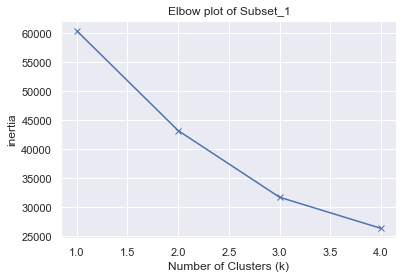

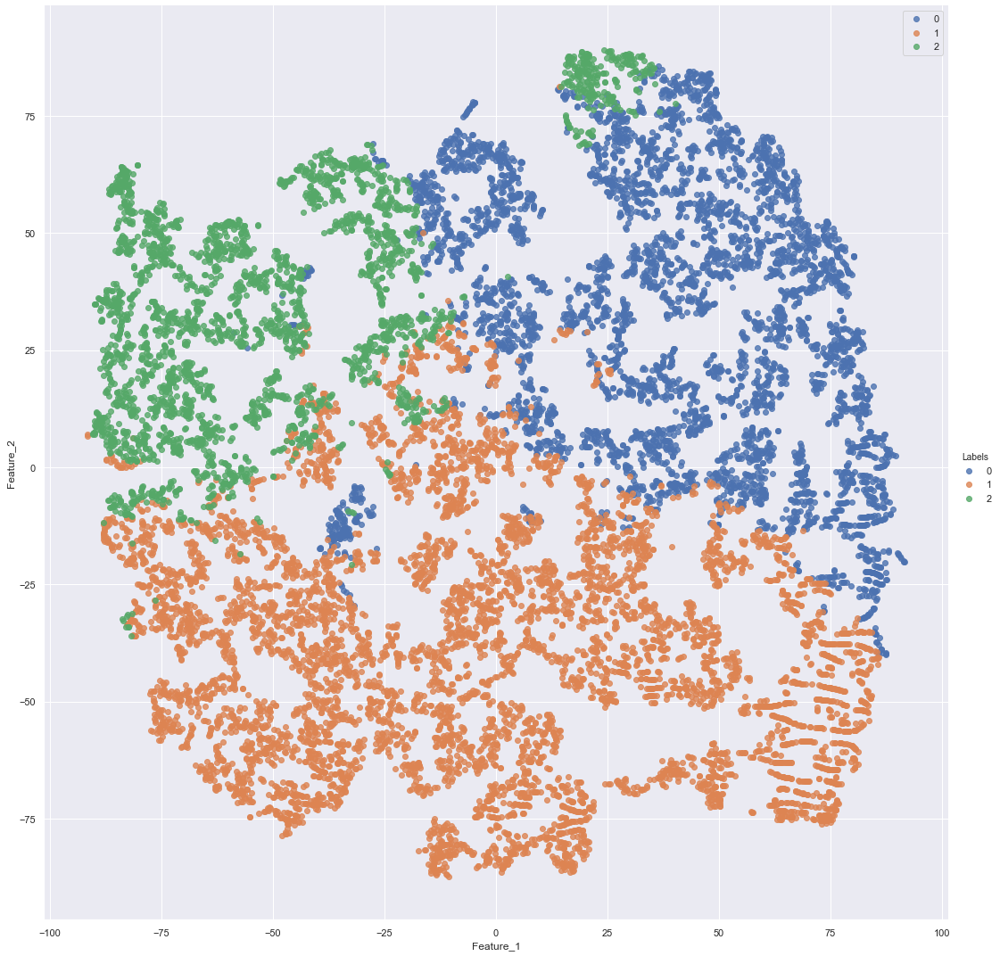

In [243]:
#Elbow Plot
elbow_plot(subset_c[0],'1',1,5)
#Applying KMeans to make 3 clusters

k1_c = Km(subset_c[0],3)
#Visualizing the graph with 3 clusters

x.text = [f'Elevation: {a}, Slope: {b}, Horizontal_Distance_To_Hydrology: {d}, Vertical_Distance_To_Hydrology: {g}' for a,b,d,g in list(zip(Elevation, Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology))]

print_graph(tsne_c[0],k1_c.labels_,'Patches_Subset_1_cluster_3',x.text)
visu(tsne_c[0],k1_c.labels_)

# Visualziation of Subset 2

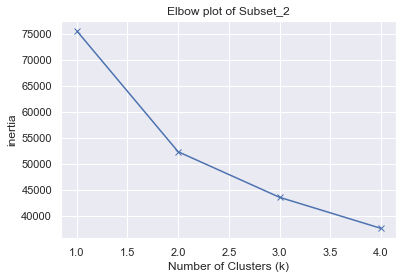

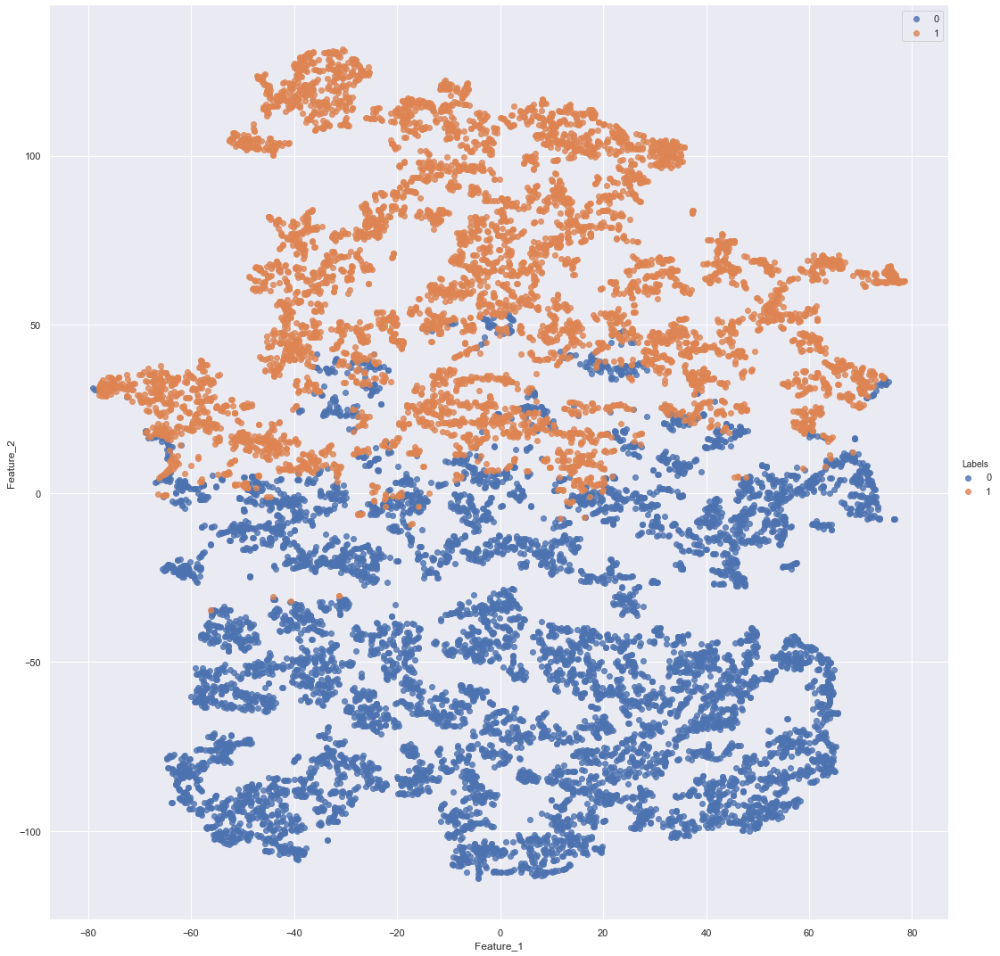

In [245]:
#Elbow Plot
elbow_plot(subset_c[1],'2',1,5)
#Applying KMeans to make 2 clusters

k2_c = Km(subset_c[1],2)
#Visualizing the graph with 2 clusters

x.text = [f'Elevation: {a}, Slope: {b}, H_D_T_R: {d}, V_D_T_H: {g}, H_D_T_F_P: {c}' for a,b,d,g,c in list(zip(Elevation, Slope,Horizontal_Distance_To_Roadways,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Fire_Points))]

print_graph(tsne_c[1],k2_c.labels_,'Patches_Subset_2_cluster_2',x.text)
visu(tsne_c[1],k2_c.labels_)

# Visualziation of Subset 3

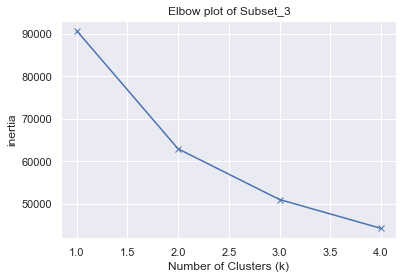

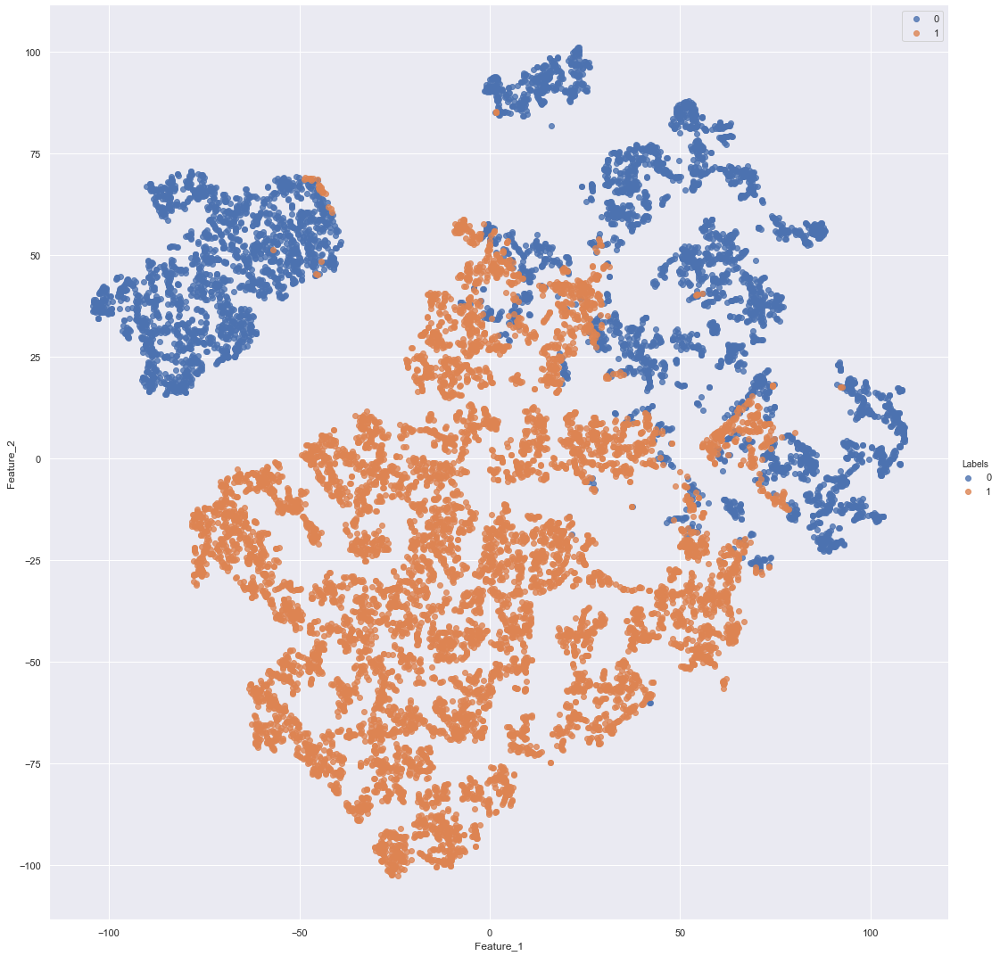

In [246]:
#Elbow Plot
elbow_plot(subset_c[2],'3',1,5)
#Applying KMeans to make 2 clusters

k3_c = Km(subset_c[2],2)
#Visualizing the graph with 2 clusters

x.text = [f'Elevation: {a}, Slope: {b}, H_D_T_R: {d}, H_D_T_H: {g}, H_D_T_F_P: {c}, Tree: {f}' for a,b,d,g,c,f in list(zip(Elevation, Slope,Horizontal_Distance_To_Roadways,Horizontal_Distance_To_Hydrology,Horizontal_Distance_To_Fire_Points,Tree))]

print_graph(tsne_c[2],k3_c.labels_,'Patches_Subset_3_cluster_2',x.text)
visu(tsne_c[2],k3_c.labels_)

# Visualziation of Subset 4

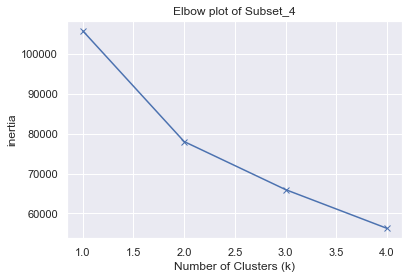

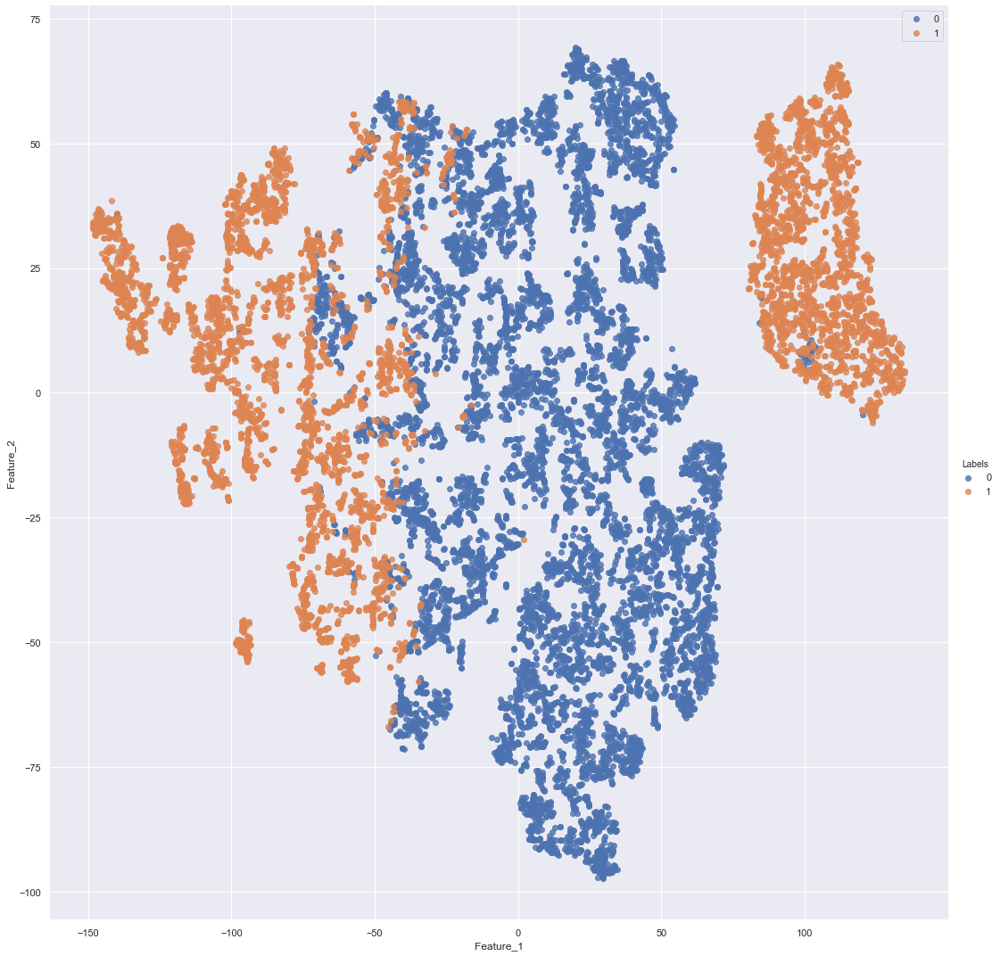

In [248]:
#Elbow Plot
elbow_plot(subset_c[3],'4',1,5)
#Applying KMeans to make 2 clusters

k4_c = Km(subset_c[3],2)
#Visualizing the graph with 2 clusters

x.text = [f'Elevation: {a}, Slope: {b}, H_D_T_R: {d}, H_D_T_H: {g}, H_D_T_F_P: {c}, Tree: {f},V_D_T_H: {v}' for a,b,d,g,c,f,v in list(zip(Elevation, Slope,Horizontal_Distance_To_Roadways,Horizontal_Distance_To_Hydrology,Horizontal_Distance_To_Fire_Points,Tree,Vertical_Distance_To_Hydrology))]

print_graph(tsne_c[3],k4_c.labels_,'Patches_Subset_4_cluster_2',x.text)
visu(tsne_c[3],k4_c.labels_)

# Applying Spectral clustering algorithm

In [108]:
scaler = ss()
col = scat.columns
# Fit your data on the scaler object
scat= scaler.fit_transform(scat)
scat = pan.DataFrame(scat, columns=col)
scat.head()

,HDTH,VDTH,HDTR,HDTFP,Tree,Slope,Elevation
0,0.146639,-0.834074,-0.908681,4.334805,-0.408248,-0.906457,0.036051
1,-0.072337,-0.932054,-0.999246,4.285710,-0.408248,-0.906457,0.036051
2,0.194243,0.227369,1.106379,4.191156,-0.408248,-0.906457,0.036051
3,0.070474,1.092853,1.038455,4.272981,-0.408248,0.705970,0.036051
4,-0.353198,-0.850404,-0.998491,4.237524,-0.408248,-0.906457,0.036051


In [110]:
subset_x = []

subset_x.append(scat[['Elevation', 'Slope','Tree']].values)
subset_x.append(scat[['Elevation', 'VDTH', 'HDTR',
       'HDTFP','HDTH']].values)
subset_x.append(scat[['Slope', 'VDTH', 'HDTR',
       'HDTFP','HDTH']].values)
subset_x.append(scat[['Tree', 'VDTH', 'HDTR',
       'HDTFP','HDTH']].values)
subset_x.append(scat[['VDTH', 'HDTR',
       'HDTFP','HDTH']].values)
subset_x.append(scat[['Elevation', 'VDTH', 'HDTR',
       'HDTFP','HDTH','Slope','Tree']].values)

In [111]:
tsne_x = []
for i in range(0,len(subset_x)):
    tsne_x.append(Tsne(subset_x[i],2,50,2000)) 
tsne_x.append(Tsne(subset_x[5],3,50,2000)) 

In [140]:
Elevation = list(data_s['Elevation'])
Slope = list(data_s['Slope'])
HDTH = list(data_s['HDTH'])
VDTH = list(data_s['VDTH'])
HDTR = list(data_s['HDTR'])
HDTFP = list(data_s['HDTFP'])
Tree = list(data_s['Tree'])

# Visualziation of Subset 5

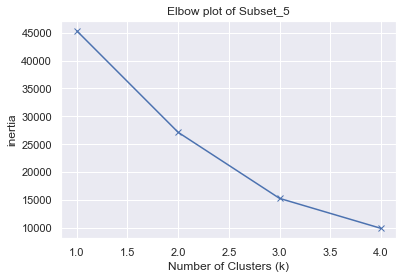

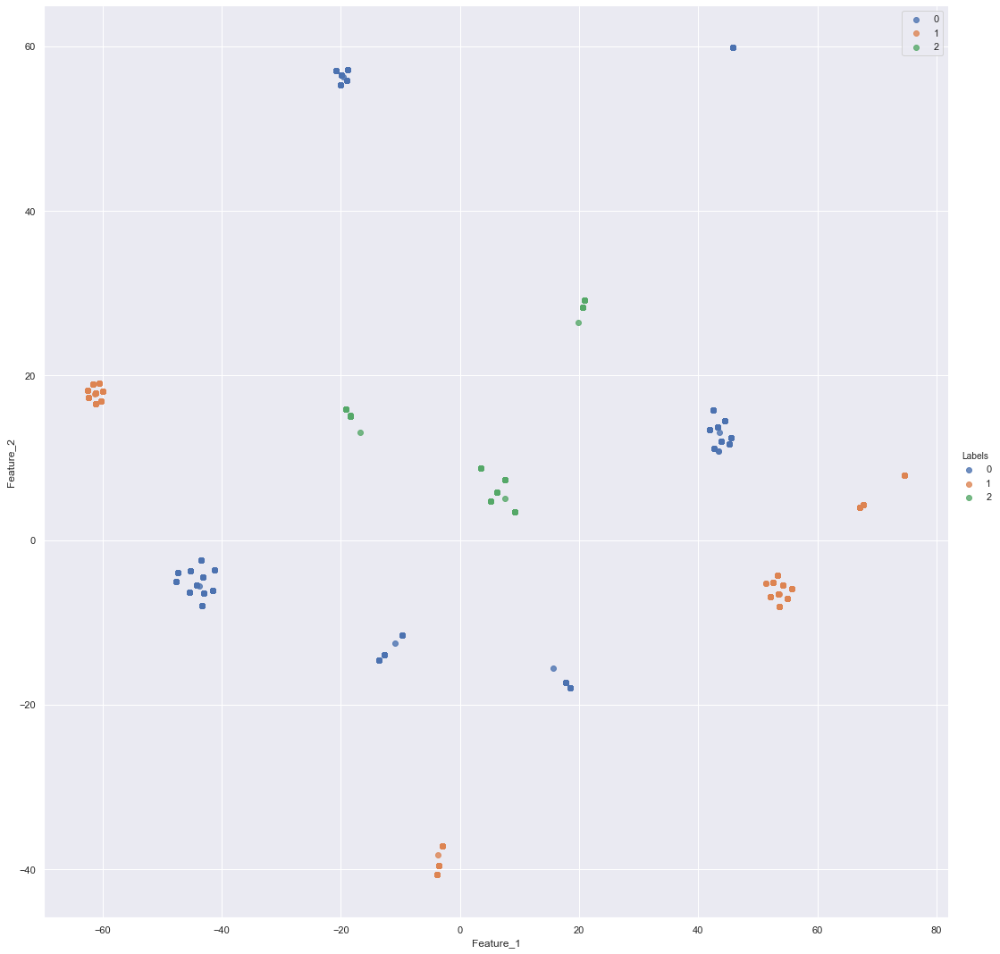

In [149]:
#Elbow Plot
elbow_plot(subset_x[0],'5',1,5)
#Applying KMeans to make 3 clusters

k5_c = Km(subset_x[0],3)
#Visualizing the graph with 3 clusters

x.text = [f'Elevation: {a}, Slope: {b},Tree: {f}' for a,b,f in list(zip(Elevation, Slope,Tree))]

print_graph(tsne_x[0],k5_c.labels_,'Patches_Subset_5_cluster_3',x.text)
visu(tsne_x[0],k5_c.labels_)

# Visualziation of Subset 6

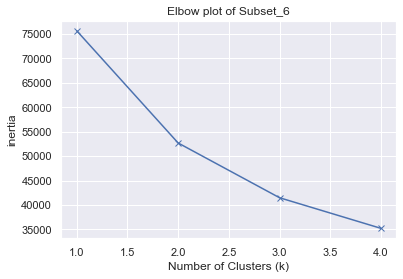

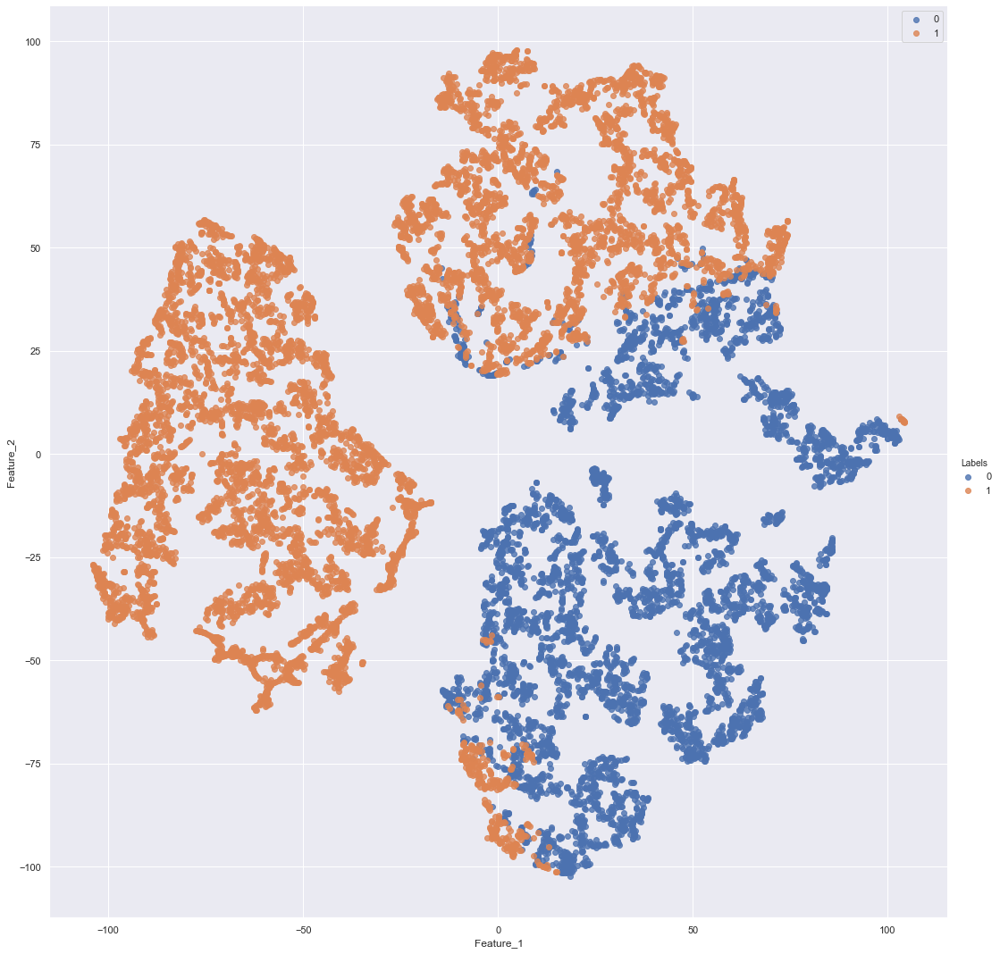

In [150]:
#Elbow Plot
elbow_plot(subset_x[1],'6',1,5)
#Applying KMeans to make 2 clusters

k6_c = Km(subset_x[1],2)
#Visualizing the graph with 2 clusters

x.text = [f'Elevation: {a}, VDTH: {b},HDTR: {f}, HDTFP: {c}, HDTH: {d}' for a,b,f,c,d in list(zip(Elevation, VDTH, HDTR,HDTFP,HDTH))]

print_graph(tsne_x[1],k6_c.labels_,'Patches_Subset_6_cluster_2',x.text)
visu(tsne_x[1],k6_c.labels_)

# Visualziation of Subset 7

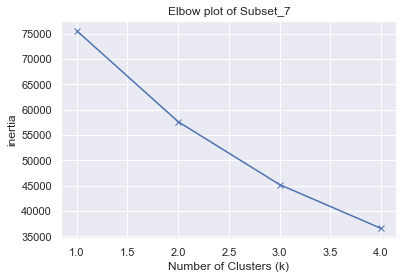

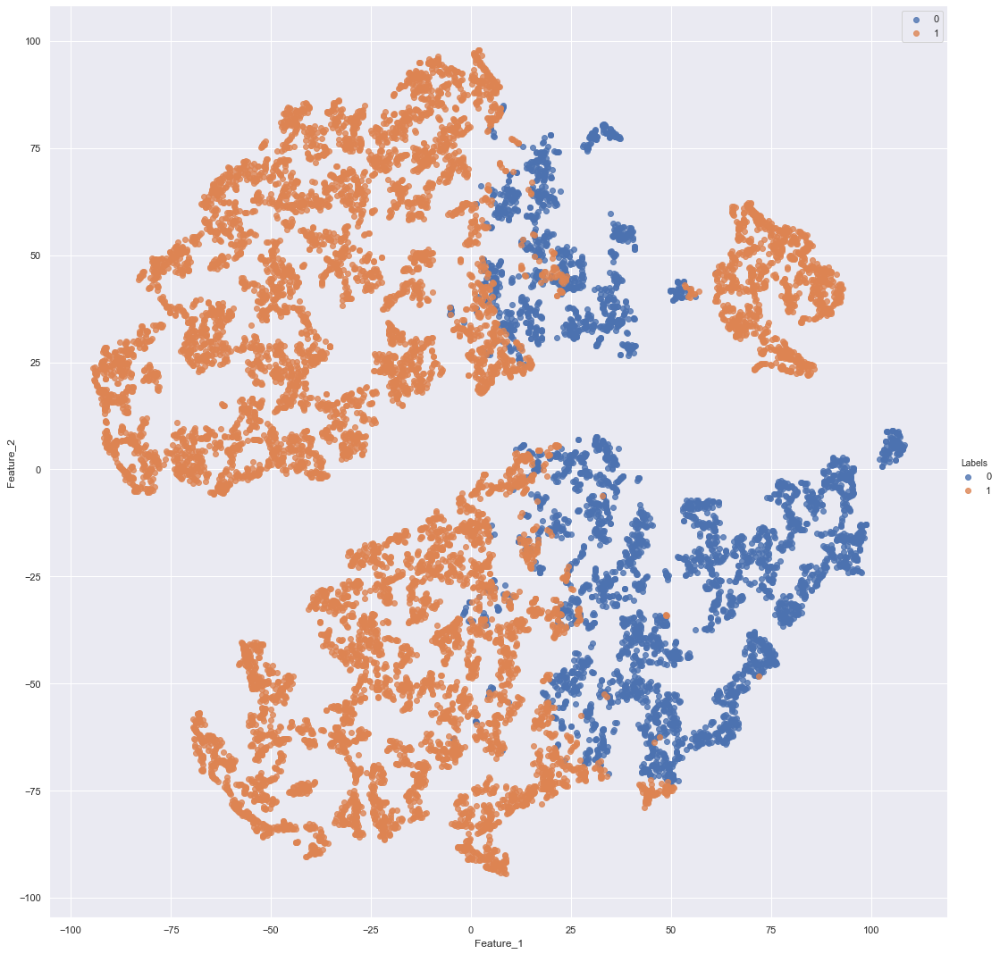

In [151]:
#Elbow Plot
elbow_plot(subset_x[2],'7',1,5)
#Applying KMeans to make 2 clusters

k7_c = Km(subset_x[2],2)
#Visualizing the graph with 2 clusters

x.text = [f'Slope: {a}, VDTH: {b},HDTR: {f}, HDTFP: {c}, HDTH: {d}' for a,b,f,c,d in list(zip(Slope, VDTH, HDTR,HDTFP,HDTH))]

print_graph(tsne_x[2],k7_c.labels_,'Patches_Subset_7_cluster_2',x.text)
visu(tsne_x[2],k7_c.labels_)

# Visualziation of Subset 8

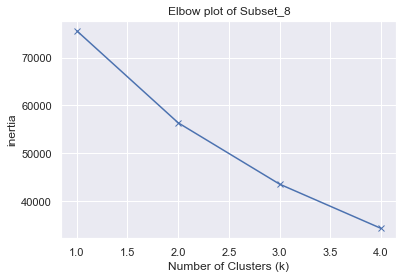

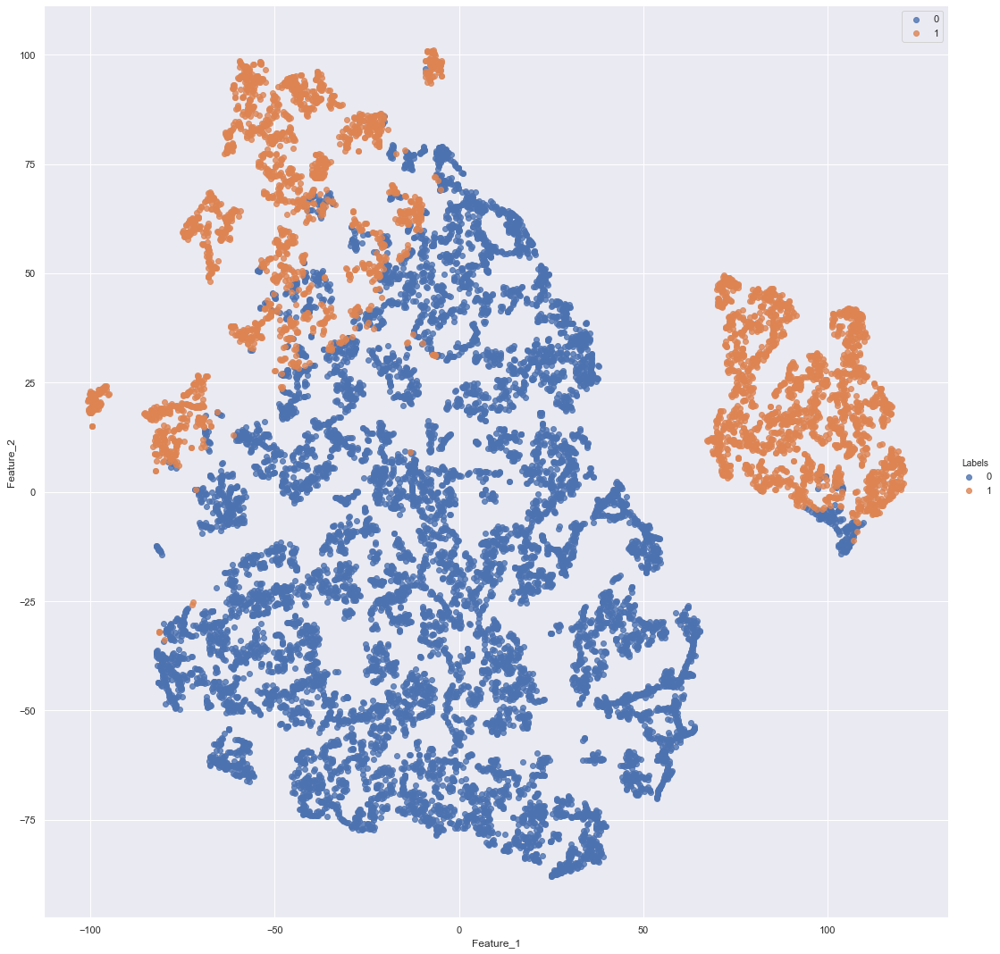

In [155]:
#Elbow Plot
elbow_plot(subset_x[3],'8',1,5)
#Applying KMeans to make 2 clusters

k8_c = Km(subset_x[3],2)
#Visualizing the graph with 2 clusters

x.text = [f'Tree: {a}, VDTH: {b},HDTR: {f}, HDTFP: {c}, HDTH: {d}' for a,b,f,c,d in list(zip(Tree, VDTH, HDTR,HDTFP,HDTH))]

print_graph(tsne_x[3],k8_c.labels_,'Patches_Subset_8_cluster_2',x.text)
visu(tsne_x[3],k8_c.labels_)

# Visualziation of Subset 9

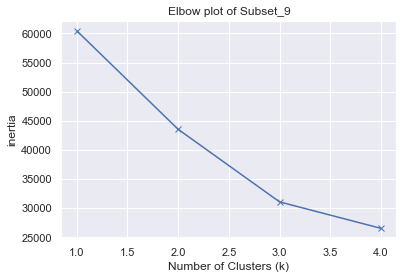

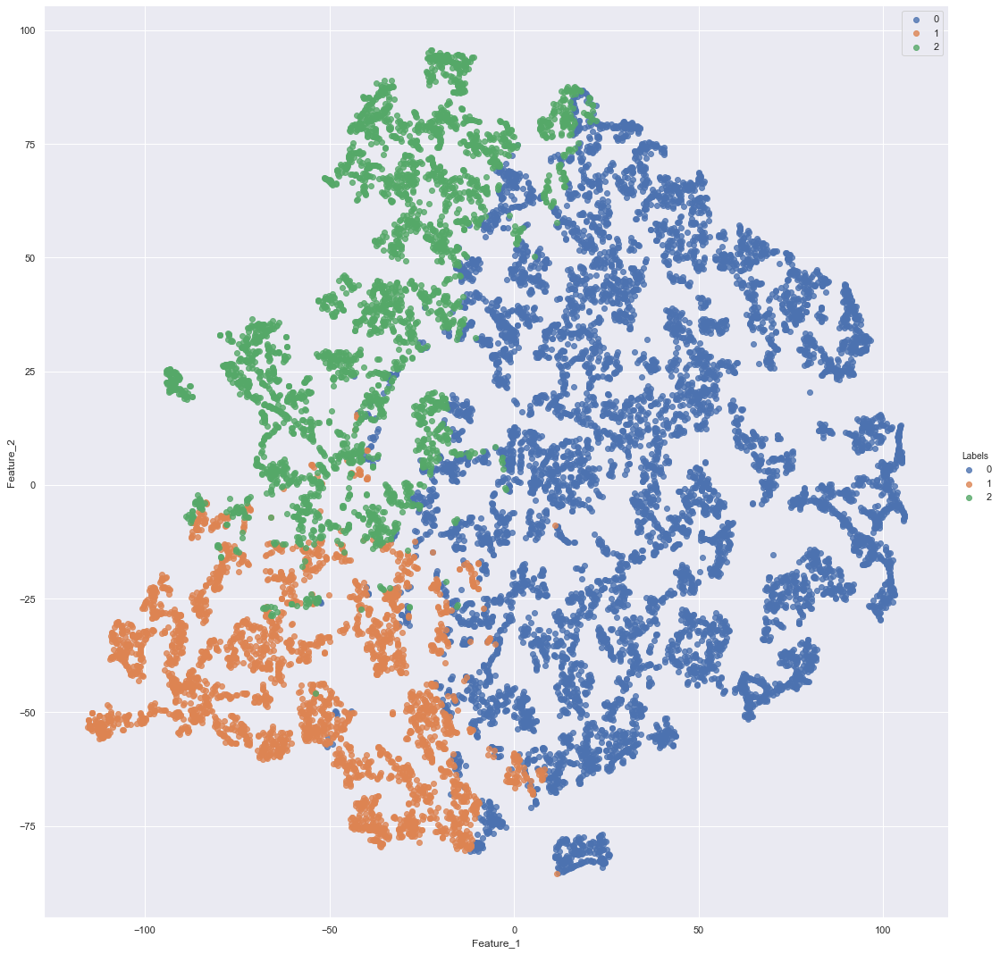

In [160]:
#Elbow Plot
elbow_plot(subset_x[4],'9',1,5)
#Applying KMeans to make 3 clusters

k9_c = Km(subset_x[4],3)
#Visualizing the graph with 3 clusters

x.text = [f'VDTH: {b},HDTR: {f}, HDTFP: {c}, HDTH: {d}' for b,f,c,d in list(zip(VDTH, HDTR,HDTFP,HDTH))]

print_graph(tsne_x[4],k9_c.labels_,'Patches_Subset_9_cluster_3',x.text)
visu(tsne_x[4],k9_c.labels_)

# Visualziation of Subset 10

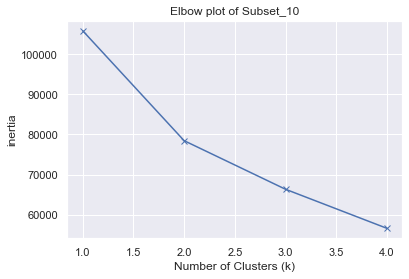

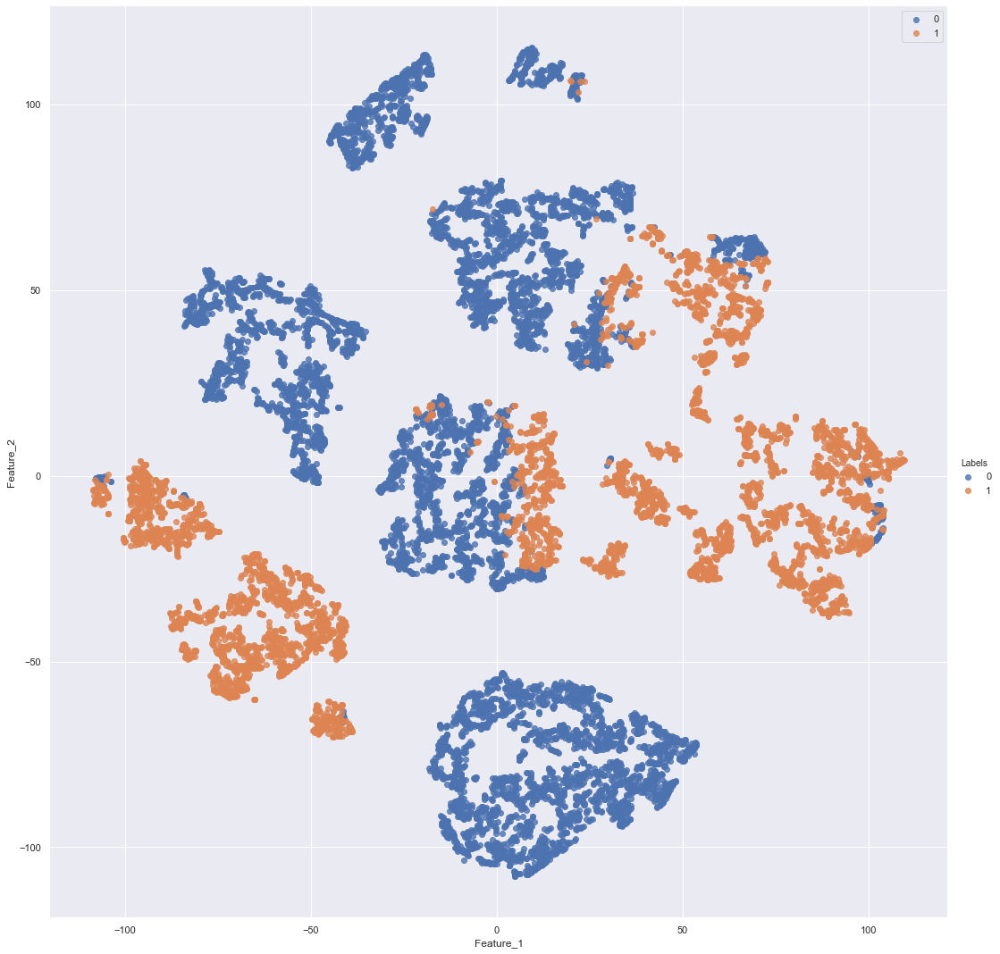

In [159]:
#Elbow Plot
elbow_plot(subset_x[5],'10',1,5)
#Applying KMeans to make 2 clusters

k10_c = Km(subset_x[5],2)
#Visualizing the graph with 2 clusters

x.text = [f'Tree: {a}, Elevation: {z}, Slope: {y}, VDTH: {b},HDTR: {f}, HDTFP: {c}, HDTH: {d}' for a,z,y,b,f,c,d in list(zip(Tree,Elevation,Slope,VDTH, HDTR,HDTFP,HDTH))]

print_graph(tsne_x[5],k10_c.labels_,'Patches_Subset_10_cluster_2',x.text)
visu(tsne_x[5],k10_c.labels_)

# 3D Visualziation of Subset 10

In [169]:
X=tsne_x[6]
import plotly.express as px
df = pan.DataFrame({'Feature_1': X[:, 0], 'Feature_2': X[:, 1],'Feature_3': X[:, 2],'Labels': k10_c.labels_})
    
fig = px.scatter_3d(df, x='Feature_1', y='Feature_2', z='Feature_3',
              color='Labels')
fig.show()